<a href="https://colab.research.google.com/github/tranlg99/L4_project/blob/main/src/colab_notebooks/second_input.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Two input model
Investigating two input model and its performance when fine-tuning, first layer, first layer + second layer, all layers along with the last layer.

Using SGD optimizer with lr=? and 30K epochs.

# Imports

In [1]:
# connecting drive to colab notebook
from google.colab import drive
drive.mount('/content/drive')

import torchvision
import numpy as np
import torch
import argparse
import cv2
from PIL import Image
from google.colab.patches import cv2_imshow
import torch.nn as nn
from collections import OrderedDict
import torch.optim as optim
import time
import copy
import torchvision.transforms as transforms
from torchvision.io.image import read_image
from torchvision.models.segmentation import fcn_resnet50, FCN_ResNet50_Weights
from torchvision.transforms.functional import to_pil_image
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import SubsetRandomSampler
from torch.autograd import Variable

import sys
sys.path.append('/content/drive/My Drive/drive_folder')
from custom_dataset_loader import TaiChiDataset, ToTensor, Normalize

Mounted at /content/drive


# Helper functions

In [3]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

def meshgrid2d(B, Y, X, stack=False, device='cuda'):
    # returns a meshgrid sized B x Y x X

    grid_y = torch.linspace(0.0, Y-1, Y, device=torch.device(device))
    grid_y = torch.reshape(grid_y, [1, Y, 1])
    grid_y = grid_y.repeat(B, 1, X)

    grid_x = torch.linspace(0.0, X-1, X, device=torch.device(device))
    grid_x = torch.reshape(grid_x, [1, 1, X])
    grid_x = grid_x.repeat(B, Y, 1)

    if stack:
        # note we stack in xy order
        # (see https://pytorch.org/docs/stable/nn.functional.html#torch.nn.functional.grid_sample)
        grid = torch.stack([grid_x, grid_y], dim=-1)
        return grid
    else:
        return grid_y, grid_x

def get_grid(N, B, H, W, normalise=False):
  N_ = np.sqrt(N).round().astype(np.int32)
  grid_y, grid_x = meshgrid2d(B, N_, N_, stack=False, device='cuda')
  grid_y = 8 + grid_y.reshape(B, -1)/float(N_-1) * (H-16)
  grid_x = 8 + grid_x.reshape(B, -1)/float(N_-1) * (W-16)

  if normalise:
    # normalise to values of range [-1, 1] - x = -1, y = -1 is the left-top pixel
    grid_x = (grid_x - W) / W 
    grid_y = (grid_y - H) / H

  xy = torch.stack([grid_x, grid_y], dim=-1) # B, N_*N_, 2
  xy = xy.view(B, N_, N_, 2)

  return xy

import matplotlib.pyplot as plt

def show_predictions(pred_coords, pred_vis, true_coords, true_vis, zeroed=False):
  pred_coords = pred_coords.cpu().detach().numpy()
  pred_vis = pred_vis.cpu().detach().numpy()
  true_coords = true_coords.cpu().numpy()
  true_vis = true_vis.cpu().numpy()

  pred_vis = pred_vis <= 0
  true_vis = true_vis <= 0

  print(np.count_nonzero(true_vis))
  print(np.count_nonzero(pred_vis))

  if zeroed:
    true_coords[ :, 0] = np.where(true_vis, 0, true_coords[ :, 0])
    true_coords[ :, 1] = np.where(true_vis, 0, true_coords[ :, 1])
    pred_coords[ :, 0] = np.where(pred_vis, 0, pred_coords[ :, 0])
    pred_coords[ :, 1] = np.where(pred_vis, 0, pred_coords[ :, 1])
    pred_vis = true_vis
  

  plt.scatter(true_coords[:, 0], true_coords[:, 1], s=0.5, marker='.', c=true_vis, cmap=plt.cm.coolwarm)
  plt.ylim(max(plt.ylim()), min(plt.ylim()))
  plt.title('True Coords')
  plt.pause(0.001)  # pause a bit so that plots are updated
  
  pred_x = pred_coords[:, 0]
  pred_y = pred_coords[:, 1]
  plt.scatter(pred_x, pred_y, s=0.5, marker='.', c=pred_vis, cmap=plt.cm.coolwarm)
  plt.ylim(max(plt.ylim()), min(plt.ylim()))
  plt.title('Predicted Coords')
  plt.pause(0.001)  # pause a bit so that plots are updated

def plot_learning_curve(losses, vis_losses, coords_losses):
  plt.plot(np.arange(len(losses)), losses, label = "total loss")
  plt.plot(np.arange(len(losses)), vis_losses, label = "vis loss")
  plt.plot(np.arange(len(losses)), coords_losses, label = "coords loss")
  plt.legend()
  plt.show()


def split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed):
  dataset_size = len(dataset)
  indices = list(range(dataset_size))
  split = int(np.floor(validation_split * dataset_size))
  if shuffle_dataset:
    np.random.seed(random_seed)
    np.random.shuffle(indices)
  train_indices, val_indices = indices[split:], indices[:split]
  train_sampler = SubsetRandomSampler(train_indices)
  valid_sampler = SubsetRandomSampler(val_indices)
  
  train_loader = DataLoader(dataset, batch_size=batch_size, sampler=train_sampler)
  validation_loader = DataLoader(dataset, batch_size=batch_size, sampler=valid_sampler)

  return train_loader, validation_loader

# Loading dataset

In [4]:
# Load dataset

TRAIN_DATA = "high_res_training_data_2023-02-09"
!unzip -d "$TRAIN_DATA"/ /content/drive/MyDrive/"$TRAIN_DATA".zip # unziping training data

dataset = TaiChiDataset(log_file=TRAIN_DATA+'/sample_ids.txt',
                        root_dir=TRAIN_DATA,
                        check=True,
                        transform=transforms.Compose([
                                               ToTensor(),
                                               Normalize(mean=[0.485, 0.456, 0.406],
                                                         std=[0.229, 0.224, 0.225])
                        ]))
print(len(dataset))

Archive:  /content/drive/MyDrive/high_res_training_data_2023-02-09.zip
   creating: high_res_training_data_2023-02-09/frame7/
  inflating: high_res_training_data_2023-02-09/frame7/-CR4xjdQbkc_792.npy  
   creating: high_res_training_data_2023-02-09/vis/
  inflating: high_res_training_data_2023-02-09/vis/-CR4xjdQbkc_792.npy  
   creating: high_res_training_data_2023-02-09/frame1/
  inflating: high_res_training_data_2023-02-09/frame1/-CR4xjdQbkc_792.npy  
   creating: high_res_training_data_2023-02-09/coords/
  inflating: high_res_training_data_2023-02-09/coords/-CR4xjdQbkc_792.npy  
   creating: high_res_training_data_2023-02-09/frame0/
  inflating: high_res_training_data_2023-02-09/frame0/-CR4xjdQbkc_792.npy  
 extracting: high_res_training_data_2023-02-09/sample_ids.txt  
   creating: high_res_training_data_2023-02-09/frame3/
  inflating: high_res_training_data_2023-02-09/frame3/-CR4xjdQbkc_792.npy  
1


# Prediction Model

In [5]:
def initialise_model(device, to_learn=[]):
  # Initialize model with the best available weights
  # create an instance of (e.g.) torchvision.models.segmentation.fcn_resnet50
  # and tell it to load pretrained weights
  weights = FCN_ResNet50_Weights.DEFAULT
  modified_model = fcn_resnet50(weights=weights)
  # print(modified_model)

  # Get first layer weights and double
  model_weights = {k: (v, v.dtype, v.shape) for k, v in modified_model.state_dict().items()}
  first_layer_weights = model_weights['backbone.conv1.weight'][0]
  # print('backbone.conv1.weight: {} {}'.format(model_weights['backbone.conv1.weight'][1], model_weights['backbone.conv1.weight'][2]))
  doubled_weights = first_layer_weights.repeat(1, 2, 1, 1)


  # modify the model by doubling input channel from 3 to 6 
  modified_model.backbone.conv1 = nn.Conv2d(6, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  # copy the doubled weights into first layer
  with torch.no_grad():
      modified_model.backbone.conv1.weight = torch.nn.Parameter(doubled_weights)

  # removing final layer and replacing with a 2D vector output at each pixel and visibility (instead of 20 class logits)
  # instead of torch.Size([1, 21, 120, 240]) -> torch.Size([1, 3, 120, 240])
  modified_model.classifier[3] = nn.Sequential()
  modified_model.classifier[4] = nn.Conv2d(512, 3, kernel_size=(1, 1), stride=(1, 1))

  # choose which params to tune
  if "all" not in to_learn:
    for name, param in modified_model.named_parameters():
      if name not in to_learn:
        param.requires_grad = False

  # model to train() and load onto computation devicce
  modified_model.to(device)
  # print(modified_model)

  return modified_model

In [ ]:
# set computation device
device = torch.device('cuda')

# initialise model
# possible params to_learn=[]:
#   'backbone.conv1.weight' - first layer
#   'backbone.layer1.0.conv1.weight' - second layer
#   'classifier.4.weight'
#   'classifier.4.bias'
#   'all' - all layers
modified_model = initialise_model(device, to_learn=['backbone.conv1.weight', 'backbone.layer1.0.conv1.weight', 'classifier.4.weight', 'classifier.4.bias'])

print('Params to learn:')
params_to_update = modified_model.parameters()
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

Downloading: "https://download.pytorch.org/models/fcn_resnet50_coco-1167a1af.pth" to /root/.cache/torch/hub/checkpoints/fcn_resnet50_coco-1167a1af.pth


  0%|          | 0.00/135M [00:00<?, ?B/s]

Params to learn:
backbone.conv1.weight
backbone.layer1.0.conv1.weight
classifier.4.weight
classifier.4.bias


## Train function

In [1]:
def train_model(model, dataloaders, criterion, vis_criterion, optimizer, num_epochs=25, verbose=False, mask=True):
  model.to(device)
  since = time.time()

  val_loss_history = []
  train_loss_history = []
  vis_loss_history = []
  coords_loss_history = []

  best_model_wts = copy.deepcopy(model.state_dict())

  for epoch in range(0,num_epochs):

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train() # Set model to training mode
            else:
                model.eval() # Set model to evaluate mode

            running_loss = 0.0
            running_vis_loss = 0.0
            running_coords_loss = 0.0
            total_samples=0

            # Iterate over data.
            for i_batch, sample_batched in enumerate(dataloaders[phase]):
              batch_size = len(sample_batched['id'])
              total_samples+=batch_size

              input1 = sample_batched['image0']
              input2 = sample_batched['image3']
              inputs = torch.cat((input1, input2), dim=1) # concatenate tensors on C dim
              # print(inputs.size())
              coords = sample_batched['coords']
              vis = torch.where(sample_batched['vis'] > 0, 1.0, 0.0)
              # vis = sample_batched['vis']

              inputs = inputs.to(device).float() #torch.Size([B, 3, 120, 240])
              coords = coords.to(device) # torch.Size([B, 1, 4096, 2])
              vis = vis.to(device)

              # zero the parameter gradients
              optimizer.zero_grad()

              # forward and track history if only in train
              with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    outputs = model(inputs) # torch.Size([B, 3, H, W]) same as inputs shape
                    outputs = outputs['out']

                    # TO DO: ABSTRACT THIS
                    # take the values of outputs from the NxN grid points
                    grid = get_grid(coords.shape[2], batch_size, outputs.shape[2], outputs.shape[3], normalise=True) # ([B, H(64), W(64), 2])
                    outputs = torch.nn.functional.grid_sample(outputs, grid) # torch.size([B,2,H,W])

                    # reshape to match target shape
                    outputs = torch.permute(outputs, (0, 2, 3, 1)) # torch.Size([B, H, W, 2])

                    # get vis predictions
                    outputs_coords = outputs[:, :, :, :2]
                    outputs_vis = outputs[:, : , :, -1] # changing to tensor with 0s and 1s??
                    outputs_vis = outputs_vis.view(batch_size,1,-1) # torch.Size([B, 1, 64*64])

                    ## coordinates = predicted displacement + grid points in (B, 360, 640, 2)
                    original_points = get_grid(coords.shape[2], batch_size, 360, 640)
                    outputs_coords = original_points + outputs_coords
                    outputs_coords = outputs_coords.view(batch_size,1,-1,2) # torch.Size([B, 1, 64*64, 2])

                    # take points that are not visible from vis ground truth data
                    point_visiblity = vis > 0 # Boolean array with True if visible

                    # zero out those in both outputs_coords and coords
                    # so they dont contribute to coords_loss
                    outputs_coords_zeroed = torch.zeros_like(outputs_coords)
                    coords_zeroed = torch.zeros_like(coords)
                    outputs_coords_zeroed[:, :, :, 0] = torch.where(point_visiblity, outputs_coords[:, :, :, 0], 0)
                    outputs_coords_zeroed[:, :, :, 1] = torch.where(point_visiblity, outputs_coords[:, :, :, 1], 0)
                    coords_zeroed[:, :, :, 0] = torch.where(point_visiblity, coords[:, :, :, 0], 0)
                    coords_zeroed[:, :, :, 1] = torch.where(point_visiblity, coords[:, :, :, 1], 0)

                    sigmoid = nn.Sigmoid()
                    vis_loss = (vis_criterion(sigmoid(outputs_vis), vis))/ 0.7
                    if mask:
                      coords_loss = (criterion(outputs_coords_zeroed, coords_zeroed))/20
                    else:
                      coords_loss = (criterion(outputs_coords, coords))/20
                    loss = coords_loss + vis_loss
                    

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_vis_loss += vis_loss.item() * inputs.size(0)
                    running_coords_loss += coords_loss.item() * inputs.size(0)

            if phase == "train" and verbose:
              epoch_loss = running_loss / total_samples
              train_loss_history.append(epoch_loss)
              vis_loss_history.append(running_vis_loss/total_samples)
              coords_loss_history.append(running_coords_loss/total_samples)

              report_frequency = num_epochs//3
              if epoch%report_frequency==0:
                print('-' * 10)
                print('Epoch {}/{}'.format(epoch, num_epochs - 1))
                print('-' * 10)

                print('{} Loss: {:.4f}'.format(phase, epoch_loss))
                print('{:.4f} coords loss, {:.4f} vis loss'.format(coords_loss, vis_loss))
                if epoch != 0:
                  plot_learning_curve(train_loss_history[-report_frequency:], vis_loss_history[-report_frequency:], coords_loss_history[-report_frequency:])

                if batch_size==1:
                  show_predictions(outputs_coords.squeeze(), outputs_vis.squeeze(), coords.squeeze(), vis.squeeze())


            # deep copy the model
            if epoch == 0:
                best_loss = epoch_loss
            if phase == 'val' and epoch_loss < best_loss:
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_loss_history.append(epoch_loss)

            
  time_elapsed = time.time() - since
  print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
  print('Train loss: {:4f}\n'.format(epoch_loss))

  # load best model weights
  model.load_state_dict(best_model_wts)
  plot_learning_curve(train_loss_history, vis_loss_history, coords_loss_history)
  show_predictions(outputs_coords.squeeze(), outputs_vis.squeeze(), coords.squeeze(), vis.squeeze(), zeroed=True)
  return model, train_loss_history, vis_loss_history, coords_loss_history


# Double check copying of weights

take old model, and new model and run for results

## Old model

In [ ]:
def initialise_model_old(device):
  # Initialize model with the best available weights
  # create an instance of (e.g.) torchvision.models.segmentation.fcn_resnet50
  # and tell it to load pretrained weights
  weights = FCN_ResNet50_Weights.DEFAULT
  modified_model = fcn_resnet50(weights=weights)

  # we are feature extracting so we only need to compute weights for the new layer
  set_parameter_requires_grad(modified_model, True)

  # modify that model by removing its final layer and replacing with a 2D vector output at each pixel and visibility (instead of 20 class logits)
  # instead of torch.Size([1, 21, 120, 240]) -> torch.Size([1, 3, 120, 240])
  modified_model.classifier[3] = nn.Sequential()
  modified_model.classifier[4] = nn.Conv2d(512, 3, kernel_size=(1, 1), stride=(1, 1))
  # print(modified_model)

  # model to train() and load onto computation devicce
  modified_model.to(device)

  return modified_model

In [ ]:
def train_model_old(model, dataloaders, criterion, vis_criterion, optimizer, num_epochs=25, verbose=False, mask=True):
  model.to(device)
  since = time.time()

  val_loss_history = []
  train_loss_history = []
  vis_loss_history = []
  coords_loss_history = []

  best_model_wts = copy.deepcopy(model.state_dict())

  for epoch in range(0,num_epochs):

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train() # Set model to training mode
            else:
                model.eval() # Set model to evaluate mode

            running_loss = 0.0
            running_vis_loss = 0.0
            running_coords_loss = 0.0
            total_samples=0

            # Iterate over data.
            for i_batch, sample_batched in enumerate(dataloaders[phase]):
              batch_size = len(sample_batched['id'])
              total_samples+=batch_size

              inputs = sample_batched['image0']
              coords = sample_batched['coords']
              vis = torch.where(sample_batched['vis'] > 0, 1.0, 0.0)
              # vis = sample_batched['vis']

              inputs = inputs.to(device).float() #torch.Size([B, 3, 120, 240])
              coords = coords.to(device) # torch.Size([B, 1, 4096, 2])
              vis = vis.to(device)

              # zero the parameter gradients
              optimizer.zero_grad()

              # forward and track history if only in train
              with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    outputs = model(inputs) # torch.Size([B, 3, H, W]) same as inputs shape
                    outputs = outputs['out']

                    # TO DO: ABSTRACT THIS
                    # take the values of outputs from the NxN grid points
                    grid = get_grid(coords.shape[2], batch_size, outputs.shape[2], outputs.shape[3], normalise=True) # ([B, H(64), W(64), 2])
                    outputs = torch.nn.functional.grid_sample(outputs, grid) # torch.size([B,2,H,W])

                    # reshape to match target shape
                    outputs = torch.permute(outputs, (0, 2, 3, 1)) # torch.Size([B, H, W, 2])

                    # get vis predictions
                    outputs_coords = outputs[:, :, :, :2]
                    outputs_vis = outputs[:, : , :, -1] # changing to tensor with 0s and 1s??
                    outputs_vis = outputs_vis.view(batch_size,1,-1) # torch.Size([B, 1, 64*64])

                    ## coordinates = predicted displacement + grid points in (B, 360, 640, 2)
                    original_points = get_grid(coords.shape[2], batch_size, 360, 640)
                    outputs_coords = original_points + outputs_coords
                    outputs_coords = outputs_coords.view(batch_size,1,-1,2) # torch.Size([B, 1, 64*64, 2])

                    # take points that are not visible from vis ground truth data
                    point_visiblity = vis > 0 # Boolean array with True if visible

                    # zero out those in both outputs_coords and coords
                    # so they dont contribute to coords_loss
                    outputs_coords_zeroed = torch.zeros_like(outputs_coords)
                    coords_zeroed = torch.zeros_like(coords)
                    outputs_coords_zeroed[:, :, :, 0] = torch.where(point_visiblity, outputs_coords[:, :, :, 0], 0)
                    outputs_coords_zeroed[:, :, :, 1] = torch.where(point_visiblity, outputs_coords[:, :, :, 1], 0)
                    coords_zeroed[:, :, :, 0] = torch.where(point_visiblity, coords[:, :, :, 0], 0)
                    coords_zeroed[:, :, :, 1] = torch.where(point_visiblity, coords[:, :, :, 1], 0)

                    sigmoid = nn.Sigmoid()
                    vis_loss = (vis_criterion(sigmoid(outputs_vis), vis))/ 0.7
                    if mask:
                      coords_loss = (criterion(outputs_coords_zeroed, coords_zeroed))/20
                    else:
                      coords_loss = (criterion(outputs_coords, coords))/20
                    loss = coords_loss + vis_loss
                    

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_vis_loss += vis_loss.item() * inputs.size(0)
                    running_coords_loss += coords_loss.item() * inputs.size(0)

            if phase == "train" and verbose:
              epoch_loss = running_loss / total_samples
              train_loss_history.append(epoch_loss)
              vis_loss_history.append(running_vis_loss/total_samples)
              coords_loss_history.append(running_coords_loss/total_samples)

              report_frequency = num_epochs//3
              if epoch%report_frequency==0 or epoch==num_epochs-1:
                print('-' * 10)
                print('Epoch {}/{}'.format(epoch, num_epochs - 1))
                print('-' * 10)

                print('{} Loss: {:.4f}'.format(phase, epoch_loss))
                print('{:.4f} coords loss, {:.4f} vis loss'.format(coords_loss, vis_loss))
                if epoch != 0:
                  plot_learning_curve(train_loss_history[-report_frequency:], vis_loss_history[-report_frequency:], coords_loss_history[-report_frequency:])

                if batch_size==1:
                  show_predictions(outputs_coords.squeeze(), outputs_vis.squeeze(), coords.squeeze(), vis.squeeze())


            # deep copy the model
            if epoch == 0:
                best_loss = epoch_loss
            if phase == 'val' and epoch_loss < best_loss:
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_loss_history.append(epoch_loss)

            
  time_elapsed = time.time() - since
  print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
  print('Train loss: {:4f}\n'.format(epoch_loss))

  # load best model weights
  model.load_state_dict(best_model_wts)
  plot_learning_curve(train_loss_history, vis_loss_history, coords_loss_history)
  show_predictions(outputs_coords.squeeze(), outputs_vis.squeeze(), coords.squeeze(), vis.squeeze(), zeroed=True)
  return model, val_loss_history


Params to learn:
classifier.4.weight
classifier.4.bias
----------
Epoch 0/9999
----------
train Loss: 2.1861
0.9689 coords loss, 1.2172 vis loss
203
4096


/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


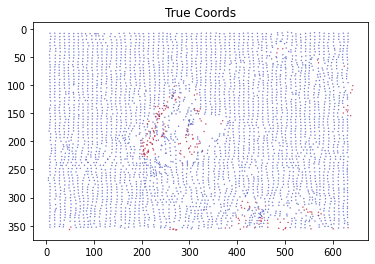

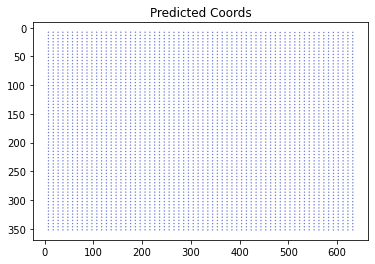

----------
Epoch 3333/9999
----------
train Loss: 0.3919
0.2771 coords loss, 0.1148 vis loss


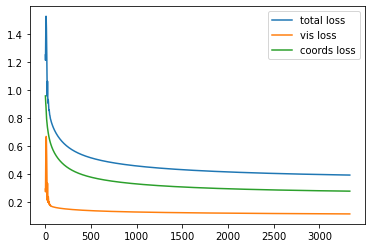

203
102


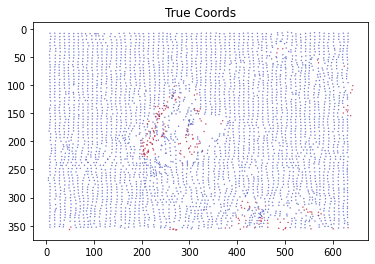

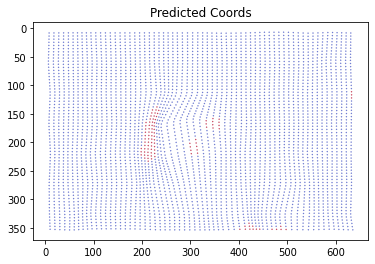

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 6666/9999
----------
train Loss: 0.3730
0.2641 coords loss, 0.1089 vis loss


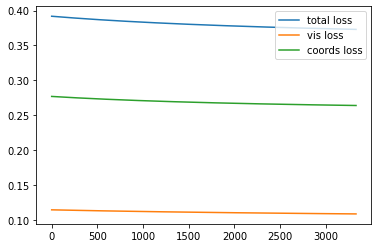

203
110


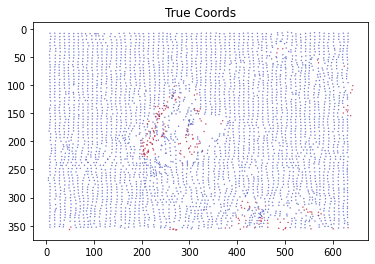

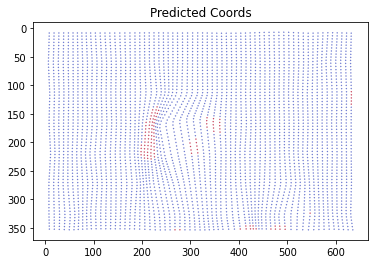

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 9999/9999
----------
train Loss: 0.3664
0.2602 coords loss, 0.1063 vis loss


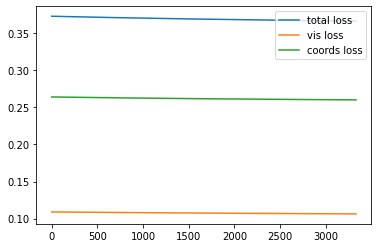

203
120


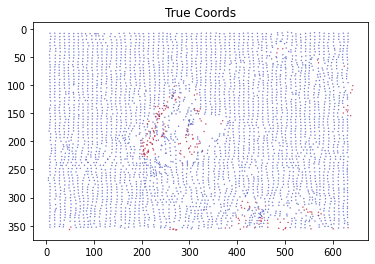

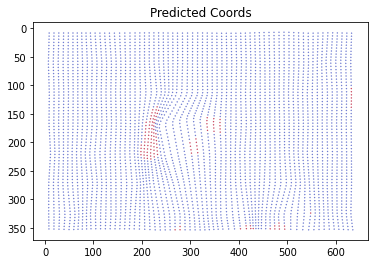

Training complete in 7m 49s
Train loss: 0.366441



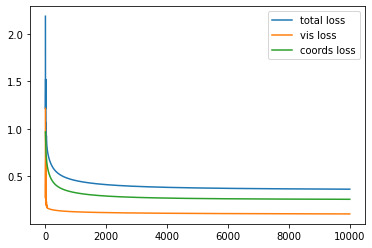

203
120


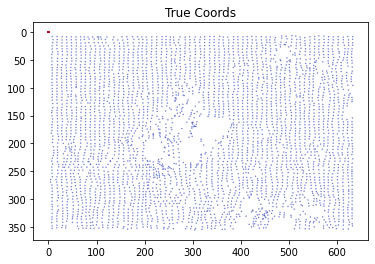

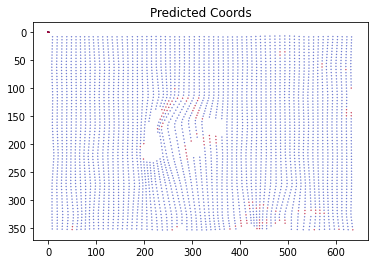

In [ ]:
# set computation device
device = torch.device('cuda')

# initialise model
modified_model = initialise_model_old(device)

# see what parameters will be tuned
params_to_update = modified_model.parameters()

print('Params to learn:')
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

# Define parameters
validation_split = .0
shuffle_dataset = True
random_seed = 42
batch_size = len(dataset)
num_epochs = 10_000

# Get train and validation dataloaders
train_loader, validation_loader = split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed)
dataloaders_dict = {'train': train_loader, 'val': validation_loader}

# Define optimizer
my_optimizer = optim.SGD(params_to_update, lr=0.101, momentum=0.9)

# Setup the loss
my_criterion = nn.MSELoss()
my_vis_criterion = nn.BCELoss()

# Train and evaluate
model_old, hist  = train_model_old(modified_model,
                                  dataloaders_dict,
                                  my_criterion,
                                  my_vis_criterion,
                                  my_optimizer,
                                  num_epochs=num_epochs,
                                  verbose=True)

## New model

In [ ]:
def initialise_model_check(device, to_learn=[]):
  # Initialize model with the best available weights
  # create an instance of (e.g.) torchvision.models.segmentation.fcn_resnet50
  # and tell it to load pretrained weights
  weights = FCN_ResNet50_Weights.DEFAULT
  modified_model = fcn_resnet50(weights=weights)
  # print(modified_model)

  # Get first layer weights and double
  model_weights = {k: (v, v.dtype, v.shape) for k, v in modified_model.state_dict().items()}
  first_layer_weights = model_weights['backbone.conv1.weight'][0]
  # print('backbone.conv1.weight: {} {}'.format(model_weights['backbone.conv1.weight'][1], model_weights['backbone.conv1.weight'][2]))
  doubled_weights = first_layer_weights.repeat(1, 2, 1, 1)

  # Zeroeing out weights for second input, to compare with old model results
  check_weights = torch.zeros_like(doubled_weights)
  check_weights[:, :3, :, :] = doubled_weights[:, :3, :, :]


  # modify the model by doubling input channel from 3 to 6 
  modified_model.backbone.conv1 = nn.Conv2d(6, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  # copy the doubled weights into first layer
  with torch.no_grad():
      modified_model.backbone.conv1.weight = torch.nn.Parameter(check_weights)

  # removing final layer and replacing with a 2D vector output at each pixel and visibility (instead of 20 class logits)
  # instead of torch.Size([1, 21, 120, 240]) -> torch.Size([1, 3, 120, 240])
  modified_model.classifier[3] = nn.Sequential()
  modified_model.classifier[4] = nn.Conv2d(512, 3, kernel_size=(1, 1), stride=(1, 1))

  # choose which params to tune
  if "all" not in to_learn:
    for name, param in modified_model.named_parameters():
      if name not in to_learn:
        param.requires_grad = False

  # model to train() and load onto computation devicce
  modified_model.to(device)
  # print(modified_model)

  return modified_model

Params to learn:
classifier.4.weight
classifier.4.bias


/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 0/9999
----------
train Loss: 1.8644
0.9682 coords loss, 0.8962 vis loss
203
474


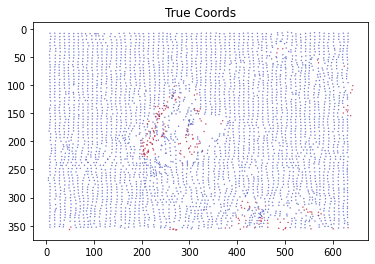

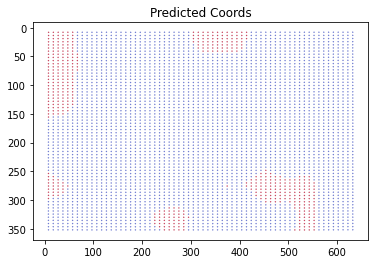

----------
Epoch 3333/9999
----------
train Loss: 0.3918
0.2771 coords loss, 0.1147 vis loss


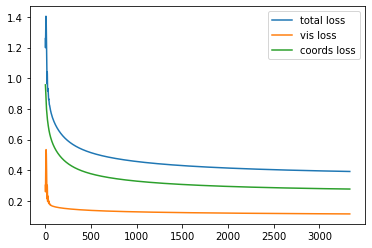

203
102


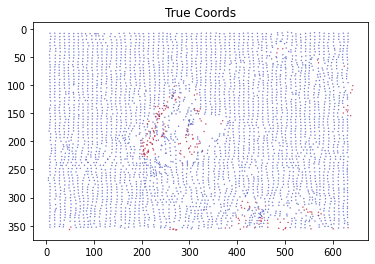

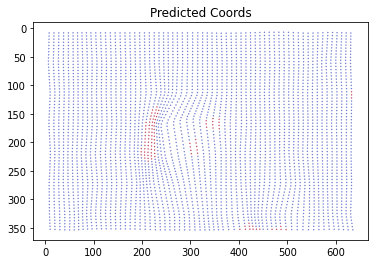

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 6666/9999
----------
train Loss: 0.3730
0.2641 coords loss, 0.1089 vis loss


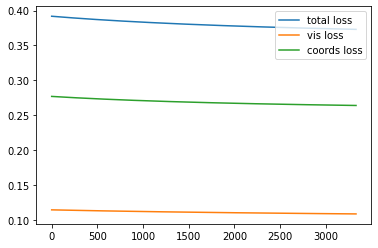

203
110


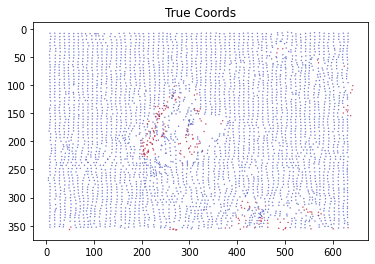

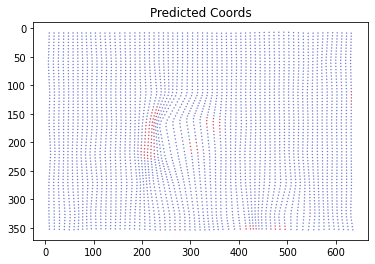

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 9999/9999
----------
train Loss: 0.3664
0.2602 coords loss, 0.1063 vis loss


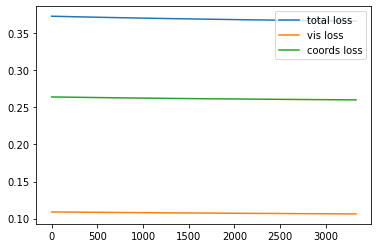

203
120


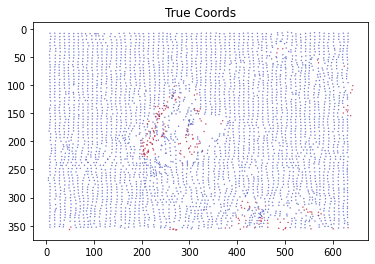

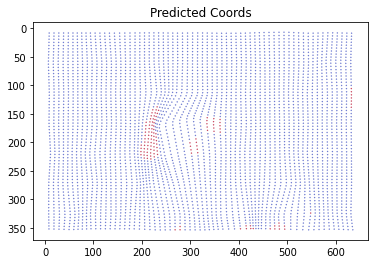

Training complete in 8m 35s
Train loss: 0.366437



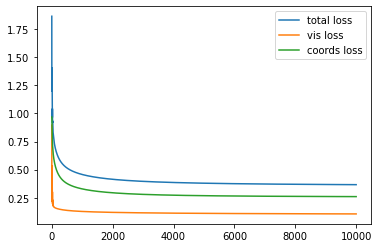

203
120


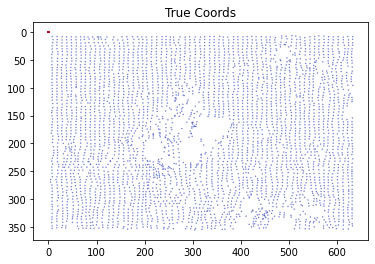

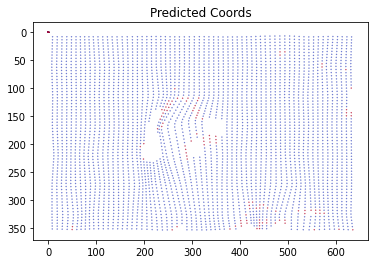

In [ ]:
# set computation device
device = torch.device('cuda')

# initialise model
modified_model = initialise_model_check(device, to_learn=['classifier.4.weight', 'classifier.4.bias'])

# see what parameters will be tuned
params_to_update = modified_model.parameters()

print('Params to learn:')
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

# Define parameters
validation_split = .0
shuffle_dataset = True
random_seed = 42
batch_size = len(dataset)
num_epochs = 10_000

# Get train and validation dataloaders
train_loader, validation_loader = split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed)
dataloaders_dict = {'train': train_loader, 'val': validation_loader}

# Define optimizer
my_optimizer = optim.SGD(params_to_update, lr=0.101, momentum=0.9)

# Setup the loss
my_criterion = nn.MSELoss()
my_vis_criterion = nn.BCELoss()

# Train and evaluate
modeln_new, modeln_tloss,  modeln_vloss,  modeln_closs  = train_model(modified_model,
                                                                  dataloaders_dict,
                                                                  my_criterion,
                                                                  my_vis_criterion,
                                                                  my_optimizer,
                                                                  num_epochs=num_epochs,
                                                                  verbose=True)

# Fine-tuning with SGD, lr=0.101

## Last layer

Params to learn:
classifier.4.weight
classifier.4.bias
----------
Epoch 0/39999
----------
train Loss: 1.8768
0.9832 coords loss, 0.8936 vis loss
203
657


/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


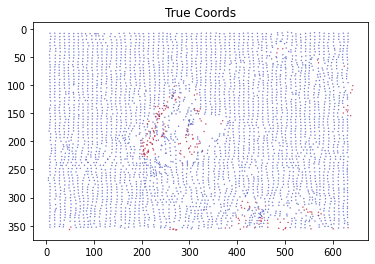

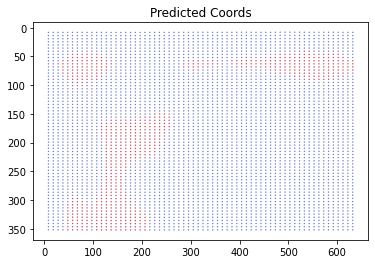

----------
Epoch 13333/39999
----------
train Loss: 0.3645
0.2597 coords loss, 0.1048 vis loss


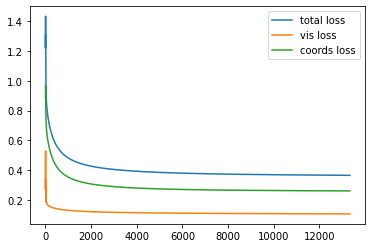

203
121


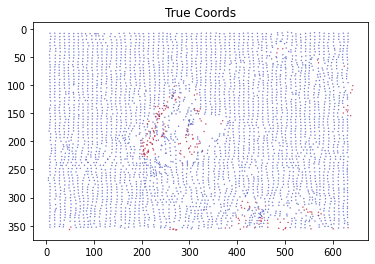

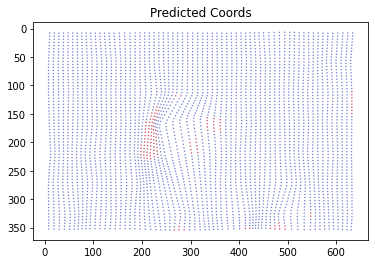

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 26666/39999
----------
train Loss: 0.3582
0.2564 coords loss, 0.1018 vis loss


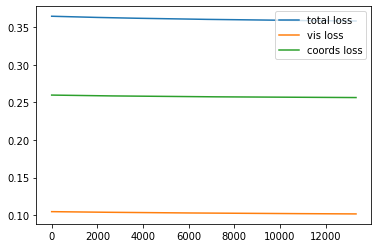

203
132


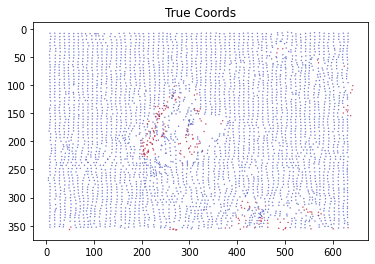

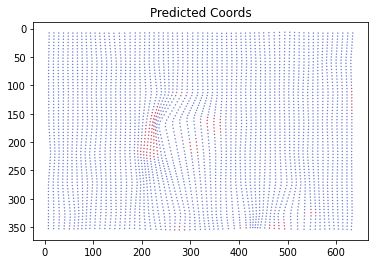

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 39999/39999
----------
train Loss: 0.3557
0.2553 coords loss, 0.1004 vis loss


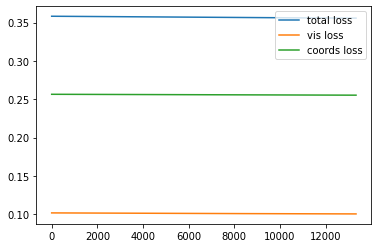

203
137


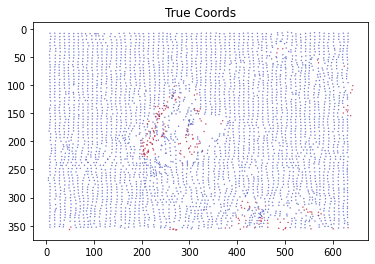

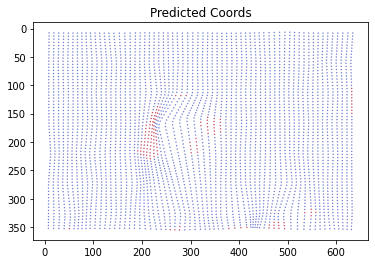

Training complete in 31m 15s
Train loss: 0.355704



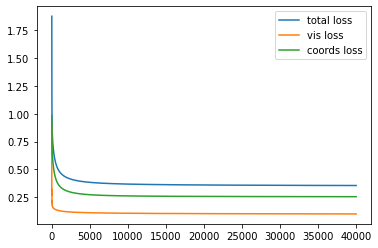

203
137


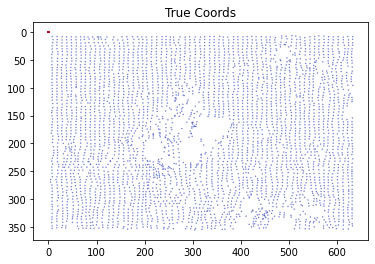

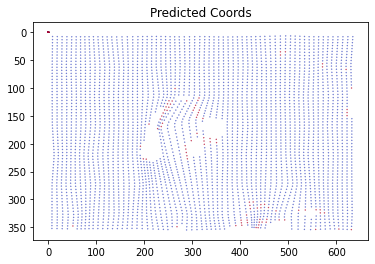

In [ ]:
# set computation device
device = torch.device('cuda')

# initialise model
modified_model = initialise_model(device, to_learn=['classifier.4.weight', 'classifier.4.bias'])

# see what parameters will be tuned
params_to_update = modified_model.parameters()

print('Params to learn:')
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

# Define parameters
validation_split = .0
shuffle_dataset = True
random_seed = 42
batch_size = len(dataset)
num_epochs = 40_000

# Get train and validation dataloaders
train_loader, validation_loader = split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed)
dataloaders_dict = {'train': train_loader, 'val': validation_loader}

# Define optimizer
my_optimizer = optim.SGD(params_to_update, lr=0.101, momentum=0.9)

# Setup the loss
my_criterion = nn.MSELoss()
my_vis_criterion = nn.BCELoss()

# Train and evaluate
model1, model1_tloss,  model1_vloss,  model1_closs  = train_model(modified_model,
                                                                  dataloaders_dict,
                                                                  my_criterion,
                                                                  my_vis_criterion,
                                                                  my_optimizer,
                                                                  num_epochs=num_epochs,
                                                                  verbose=True)

## First and last layer

Params to learn:
backbone.conv1.weight
classifier.4.weight
classifier.4.bias
----------
Epoch 0/39999
----------
train Loss: 2.0294
0.9733 coords loss, 1.0561 vis loss
203
3339


/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


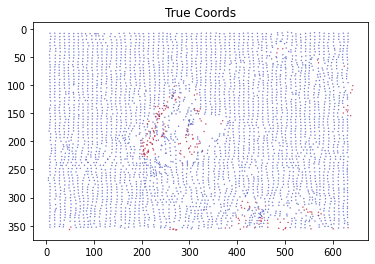

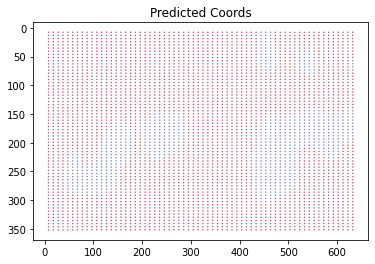

----------
Epoch 13333/39999
----------
train Loss: 0.3530
0.2547 coords loss, 0.0983 vis loss


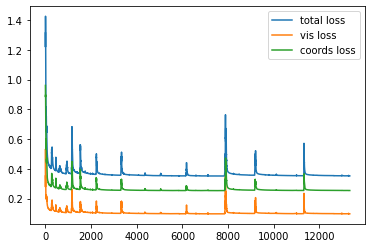

203
147


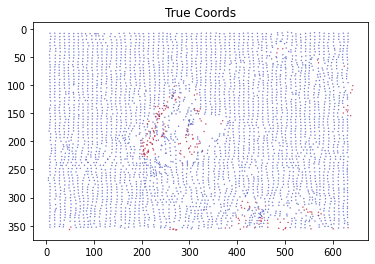

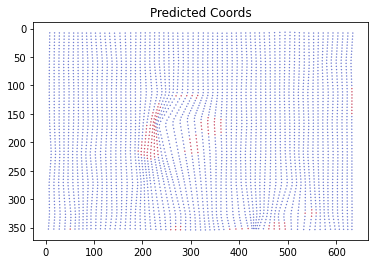

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 26666/39999
----------
train Loss: 0.3506
0.2539 coords loss, 0.0967 vis loss


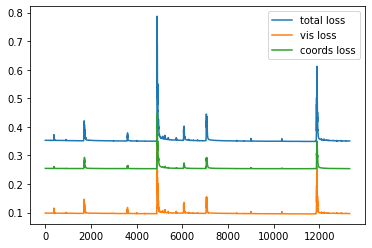

203
150


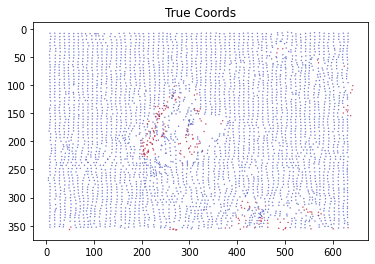

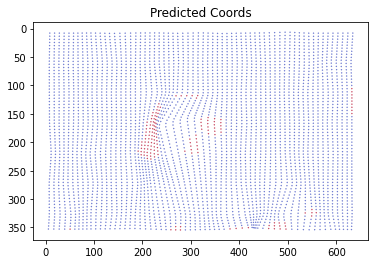

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 39999/39999
----------
train Loss: 0.3491
0.2535 coords loss, 0.0956 vis loss


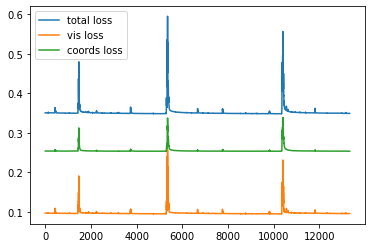

203
148


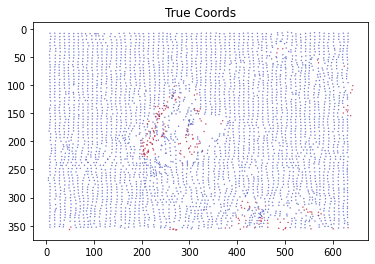

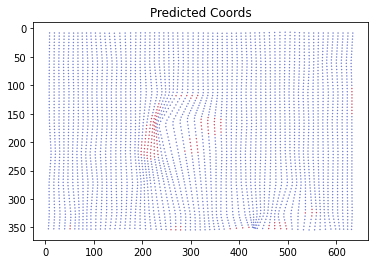

Training complete in 25m 46s
Train loss: 0.349089



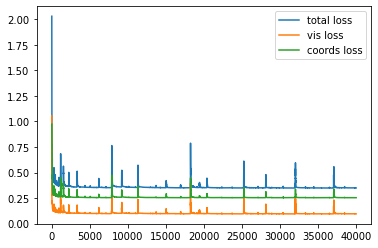

203
148


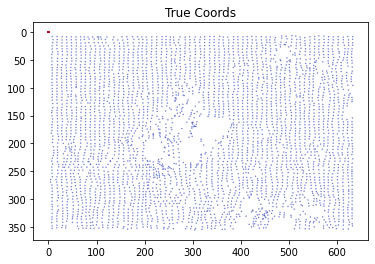

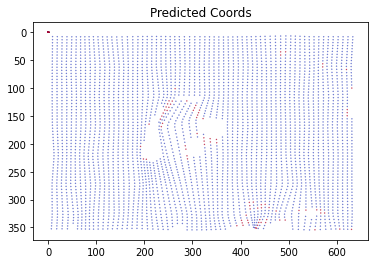

In [ ]:
# set computation device
device = torch.device('cuda')

# initialise model
modified_model = initialise_model(device, to_learn=['backbone.conv1.weight', 'classifier.4.weight', 'classifier.4.bias'])

# see what parameters will be tuned
params_to_update = modified_model.parameters()

print('Params to learn:')
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

# Define parameters
validation_split = .0
shuffle_dataset = True
random_seed = 42
batch_size = len(dataset)
num_epochs = 40_000

# Get train and validation dataloaders
train_loader, validation_loader = split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed)
dataloaders_dict = {'train': train_loader, 'val': validation_loader}

# Define optimizer
my_optimizer = optim.SGD(params_to_update, lr=0.101, momentum=0.9)

# Setup the loss
my_criterion = nn.MSELoss()
my_vis_criterion = nn.BCELoss()

# Train and evaluate
model2, model2_tloss,  model2_vloss,  model2_closs  = train_model(modified_model,
                                                                  dataloaders_dict,
                                                                  my_criterion,
                                                                  my_vis_criterion,
                                                                  my_optimizer,
                                                                  num_epochs=num_epochs,
                                                                  verbose=True)

## First, second and last layer


Params to learn:
backbone.conv1.weight
backbone.layer1.0.conv1.weight
classifier.4.weight
classifier.4.bias
----------
Epoch 0/39999
----------
train Loss: 1.8751
0.9719 coords loss, 0.9032 vis loss
203
489


/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


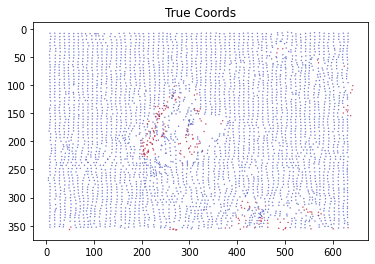

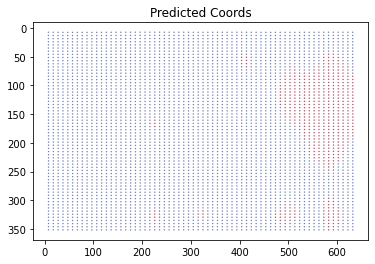

----------
Epoch 13333/39999
----------
train Loss: 0.3508
0.2541 coords loss, 0.0967 vis loss


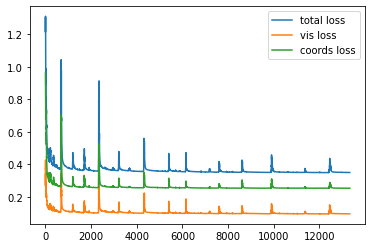

203
149


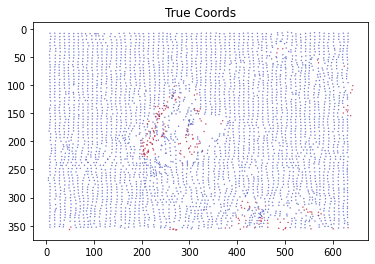

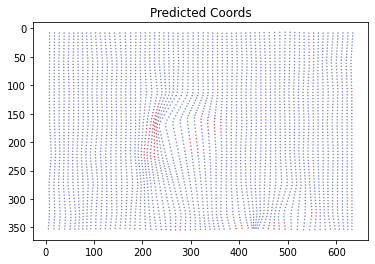

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 26666/39999
----------
train Loss: 0.7046
0.3668 coords loss, 0.3378 vis loss


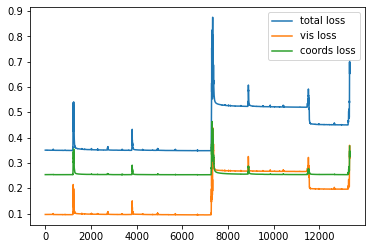

203
52


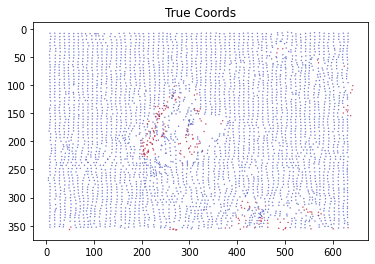

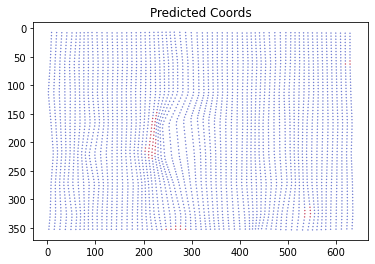

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 39999/39999
----------
train Loss: 0.4507
0.2542 coords loss, 0.1965 vis loss


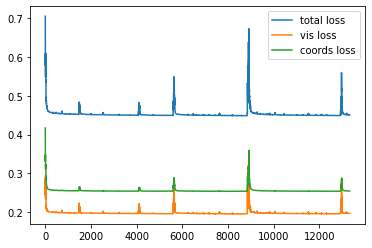

203
149


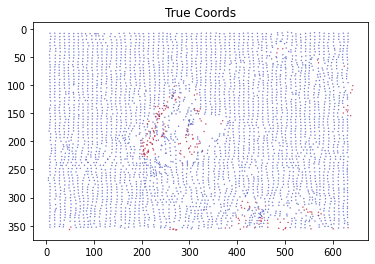

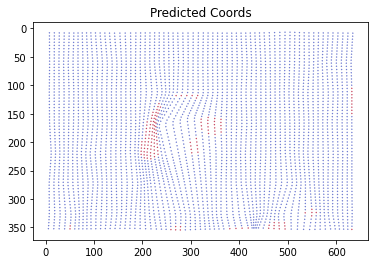

Training complete in 24m 28s
Train loss: 0.450726



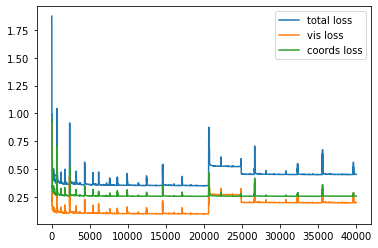

203
149


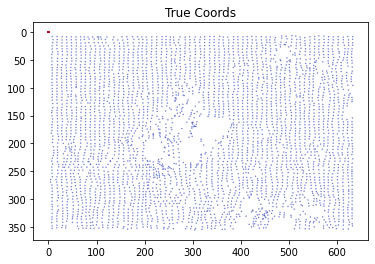

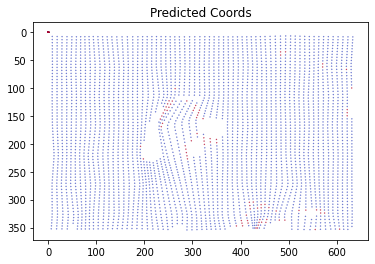

In [ ]:
# set computation device
device = torch.device('cuda')

# initialise model
modified_model = initialise_model(device, to_learn=['backbone.conv1.weight', 'backbone.layer1.0.conv1.weight', 'classifier.4.weight', 'classifier.4.bias'])

# see what parameters will be tuned
params_to_update = modified_model.parameters()

print('Params to learn:')
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

# Define parameters
validation_split = .0
shuffle_dataset = True
random_seed = 42
batch_size = len(dataset)
num_epochs = 40_000

# Get train and validation dataloaders
train_loader, validation_loader = split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed)
dataloaders_dict = {'train': train_loader, 'val': validation_loader}

# Define optimizer
my_optimizer = optim.SGD(params_to_update, lr=0.101, momentum=0.9)

# Setup the loss
my_criterion = nn.MSELoss()
my_vis_criterion = nn.BCELoss()

# Train and evaluate
model3, model3_tloss,  model3_vloss,  model3_closs  = train_model(modified_model,
                                                                  dataloaders_dict,
                                                                  my_criterion,
                                                                  my_vis_criterion,
                                                                  my_optimizer,
                                                                  num_epochs=num_epochs,
                                                                  verbose=True)

## All layers

Params to learn:
backbone.conv1.weight
backbone.bn1.weight
backbone.bn1.bias
backbone.layer1.0.conv1.weight
backbone.layer1.0.bn1.weight
backbone.layer1.0.bn1.bias
backbone.layer1.0.conv2.weight
backbone.layer1.0.bn2.weight
backbone.layer1.0.bn2.bias
backbone.layer1.0.conv3.weight
backbone.layer1.0.bn3.weight
backbone.layer1.0.bn3.bias
backbone.layer1.0.downsample.0.weight
backbone.layer1.0.downsample.1.weight
backbone.layer1.0.downsample.1.bias
backbone.layer1.1.conv1.weight
backbone.layer1.1.bn1.weight
backbone.layer1.1.bn1.bias
backbone.layer1.1.conv2.weight
backbone.layer1.1.bn2.weight
backbone.layer1.1.bn2.bias
backbone.layer1.1.conv3.weight
backbone.layer1.1.bn3.weight
backbone.layer1.1.bn3.bias
backbone.layer1.2.conv1.weight
backbone.layer1.2.bn1.weight
backbone.layer1.2.bn1.bias
backbone.layer1.2.conv2.weight
backbone.layer1.2.bn2.weight
backbone.layer1.2.bn2.bias
backbone.layer1.2.conv3.weight
backbone.layer1.2.bn3.weight
backbone.layer1.2.bn3.bias
backbone.layer2.0.conv1.weig

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 0/39999
----------
train Loss: 2.1068
0.9806 coords loss, 1.1262 vis loss
203
4000


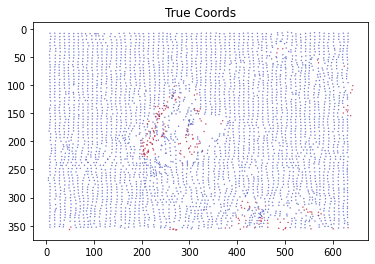

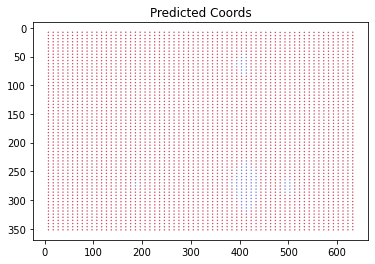

----------
Epoch 13333/39999
----------
train Loss: 0.3422
0.2528 coords loss, 0.0894 vis loss


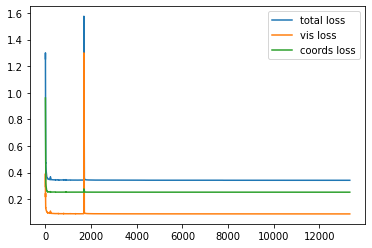

203
152


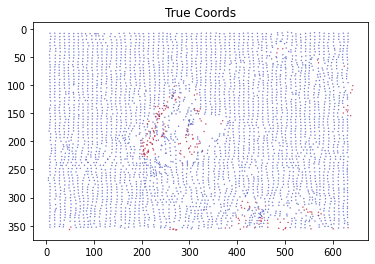

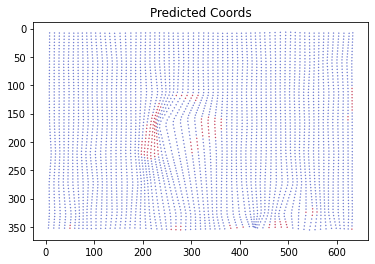

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 26666/39999
----------
train Loss: 0.3421
0.2528 coords loss, 0.0893 vis loss


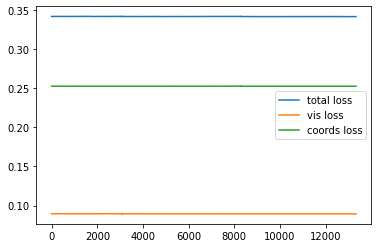

203
149


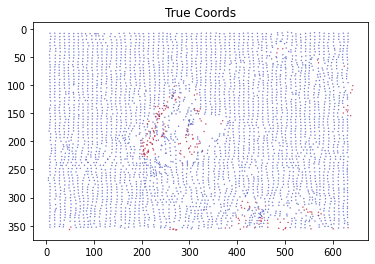

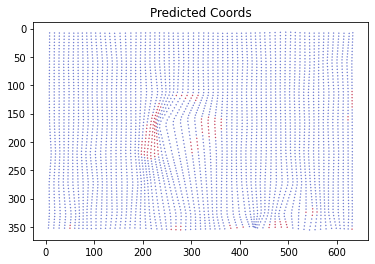

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 39999/39999
----------
train Loss: 0.3419
0.2528 coords loss, 0.0891 vis loss


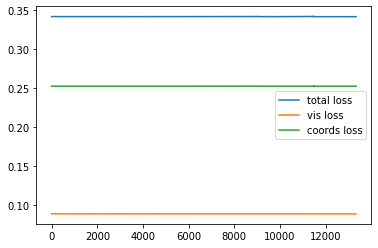

203
153


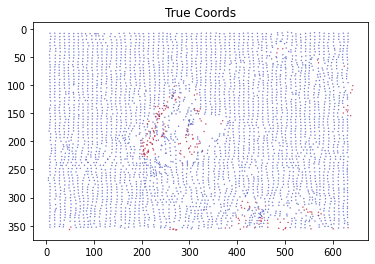

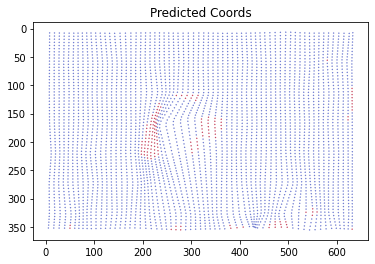

Training complete in 38m 38s
Train loss: 0.341927



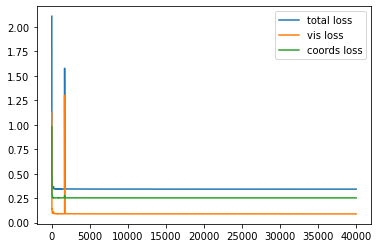

203
153


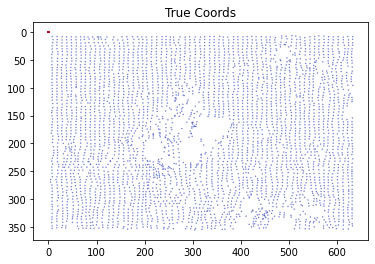

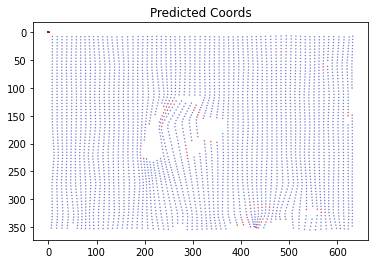

In [ ]:
# set computation device
device = torch.device('cuda')

# initialise model
modified_model = initialise_model(device, to_learn=['all'])

# see what parameters will be tuned
params_to_update = modified_model.parameters()
print('Params to learn:')
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

# Define parameters
validation_split = .0
shuffle_dataset = True
random_seed = 42
batch_size = len(dataset)
num_epochs = 40_000

# Get train and validation dataloaders
train_loader, validation_loader = split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed)
dataloaders_dict = {'train': train_loader, 'val': validation_loader}

# Define optimizer
my_optimizer = optim.SGD(params_to_update, lr=0.101, momentum=0.9)

# Setup the loss
my_criterion = nn.MSELoss()
my_vis_criterion = nn.BCELoss()

# Train and evaluate
model4, model4_tloss,  model4_vloss,  model4_closs  = train_model(modified_model,
                                                                  dataloaders_dict,
                                                                  my_criterion,
                                                                  my_vis_criterion,
                                                                  my_optimizer,
                                                                  num_epochs=num_epochs,
                                                                  verbose=True)


## Results

In [ ]:
# plot results of losses:
# epochs : 40K
# lr = 0.101
# what layers were tuned

from tabulate import tabulate

last = ['last layer', model1_tloss[0], model1_tloss[1000-1], model1_tloss[5000-1], model1_tloss[10000-1], model1_tloss[20000-1], model1_tloss[40000-1]]
first = ['+ first layer', model2_tloss[0], model2_tloss[1000-1], model2_tloss[5000-1], model2_tloss[10000-1], model2_tloss[20000-1], model2_tloss[40000-1]]
second = ['+ second layer', model3_tloss[0], model3_tloss[1000-1], model3_tloss[5000-1], model3_tloss[10000-1], model3_tloss[20000-1], model3_tloss[40000-1]]
all = ['all layers', model4_tloss[0], model4_tloss[1000-1], model4_tloss[5000-1], model4_tloss[10000-1], model4_tloss[20000-1], model4_tloss[40000-1]]


results = [['fine-tuning lr=0.101', 'E=0', 'E=1000', 'E=5000','E=10_000', 'E=20_000', 'E=40_000'],
           last,
           first, 
           second,
           all]

print(tabulate(results, headers='firstrow', tablefmt='fancy_grid'))

╒════════════════════════╤═════════╤══════════╤══════════╤════════════╤════════════╤════════════╕
│ fine-tuning lr=0.101   │     E=0 │   E=1000 │   E=5000 │   E=10_000 │   E=20_000 │   E=40_000 │
╞════════════════════════╪═════════╪══════════╪══════════╪════════════╪════════════╪════════════╡
│ last layer             │ 1.87685 │ 0.481334 │ 0.384068 │   0.368453 │   0.360376 │   0.355704 │
├────────────────────────┼─────────┼──────────┼──────────┼────────────┼────────────┼────────────┤
│ + first layer          │ 2.02945 │ 0.37702  │ 0.354414 │   0.35747  │   0.352869 │   0.349089 │
├────────────────────────┼─────────┼──────────┼──────────┼────────────┼────────────┼────────────┤
│ + second layer         │ 1.87507 │ 0.379478 │ 0.358825 │   0.357815 │   0.349416 │   0.450726 │
├────────────────────────┼─────────┼──────────┼──────────┼────────────┼────────────┼────────────┤
│ all layers             │ 2.1068  │ 0.34391  │ 0.342711 │   0.342346 │   0.342151 │   0.341927 │
╘═══════════════════

# Fine-tuning with SGD, lr=0.05

## Last layer

Params to learn:
classifier.4.weight
classifier.4.bias
----------
Epoch 0/39999
----------
train Loss: 1.8252
0.9692 coords loss, 0.8560 vis loss
203
0


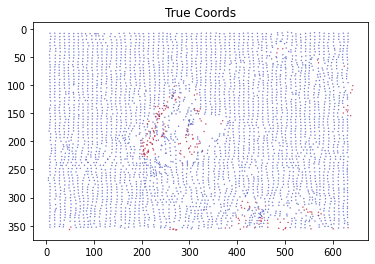

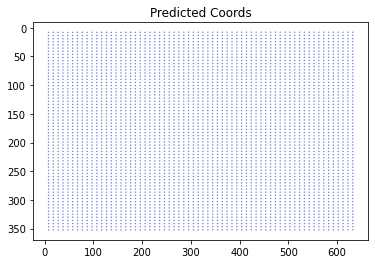

----------
Epoch 13333/39999
----------
train Loss: 0.3766
0.2676 coords loss, 0.1091 vis loss


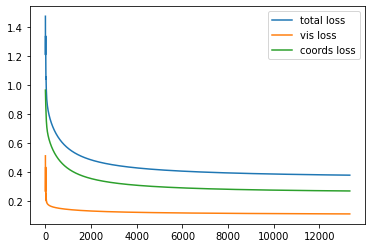

203
111


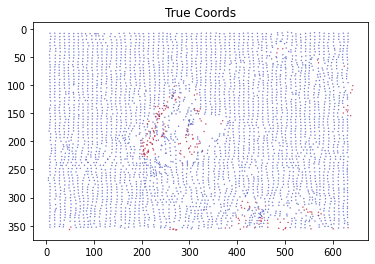

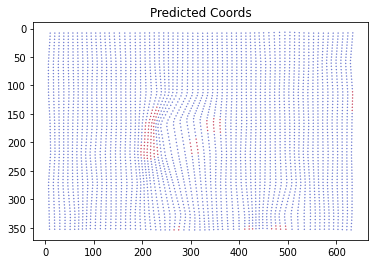

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 26666/39999
----------
train Loss: 0.3646
0.2598 coords loss, 0.1048 vis loss


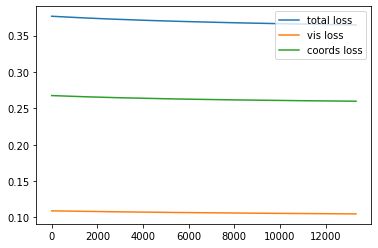

203
121


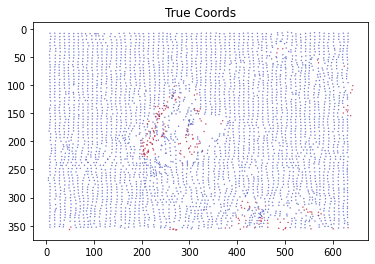

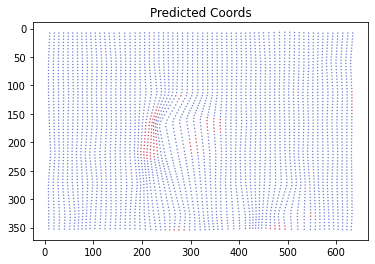

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 39999/39999
----------
train Loss: 0.3605
0.2576 coords loss, 0.1029 vis loss


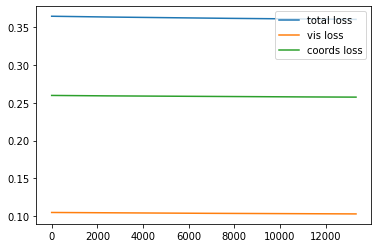

203
129


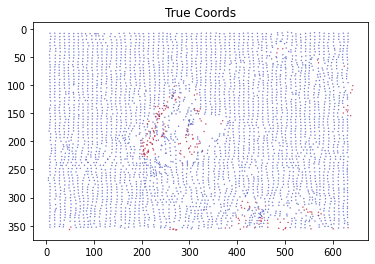

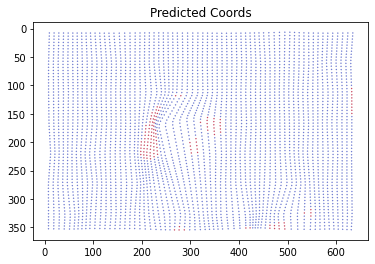

Training complete in 33m 54s
Train loss: 0.360481



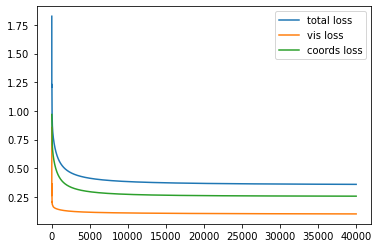

203
129


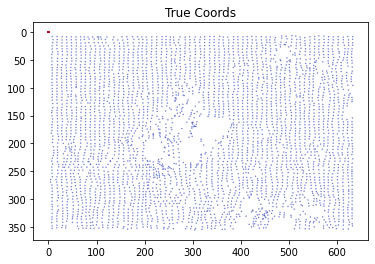

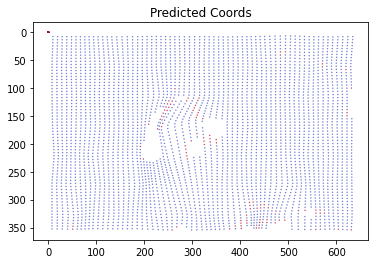

In [ ]:
# set computation device
device = torch.device('cuda')

# initialise model
modified_model = initialise_model(device, to_learn=['classifier.4.weight', 'classifier.4.bias'])

# see what parameters will be tuned
params_to_update = modified_model.parameters()

print('Params to learn:')
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

# Define parameters
validation_split = .0
shuffle_dataset = True
random_seed = 42
batch_size = len(dataset)
num_epochs = 40_000

# Get train and validation dataloaders
train_loader, validation_loader = split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed)
dataloaders_dict = {'train': train_loader, 'val': validation_loader}

# Define optimizer
my_optimizer = optim.SGD(params_to_update, lr=0.05, momentum=0.9)

# Setup the loss
my_criterion = nn.MSELoss()
my_vis_criterion = nn.BCELoss()

# Train and evaluate
model5, model5_tloss,  model5_vloss,  model5_closs  = train_model(modified_model,
                                                                  dataloaders_dict,
                                                                  my_criterion,
                                                                  my_vis_criterion,
                                                                  my_optimizer,
                                                                  num_epochs=num_epochs,
                                                                  verbose=True)

## First and last layer

Params to learn:
backbone.conv1.weight
classifier.4.weight
classifier.4.bias
----------
Epoch 0/39999
----------
train Loss: 1.7918
0.9574 coords loss, 0.8343 vis loss
203
12


/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


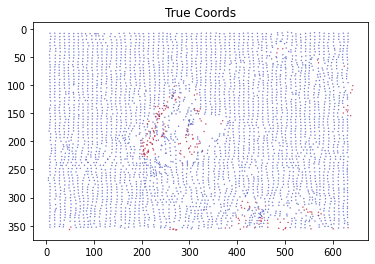

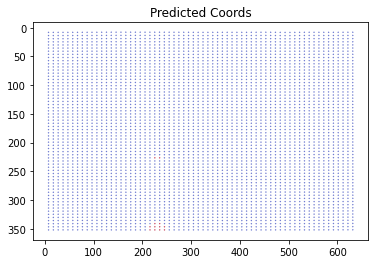

----------
Epoch 13333/39999
----------
train Loss: 0.3532
0.2552 coords loss, 0.0980 vis loss


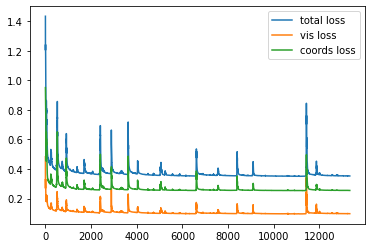

203
144


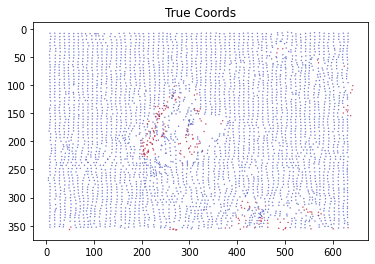

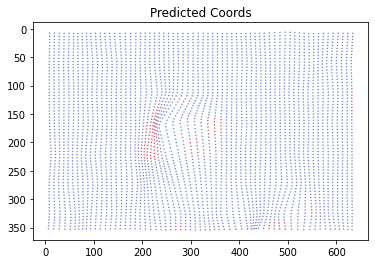

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 26666/39999
----------
train Loss: 0.3501
0.2540 coords loss, 0.0961 vis loss


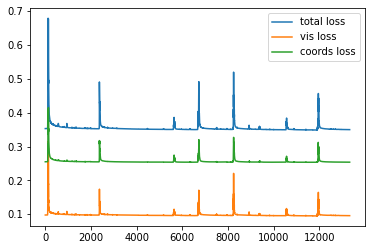

203
147


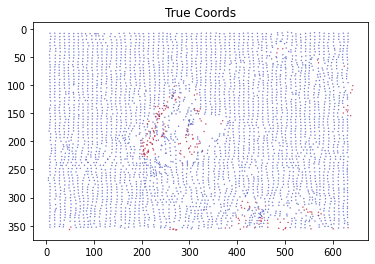

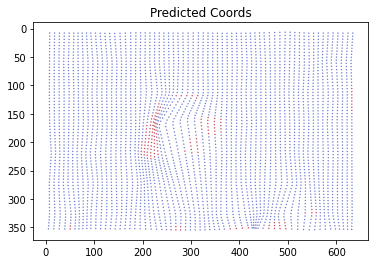

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 39999/39999
----------
train Loss: 0.3537
0.2562 coords loss, 0.0975 vis loss


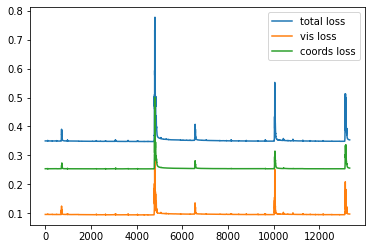

203
146


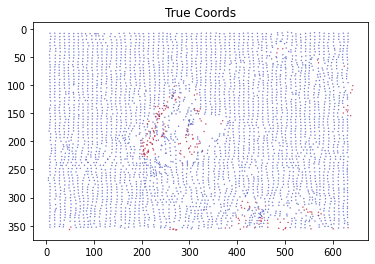

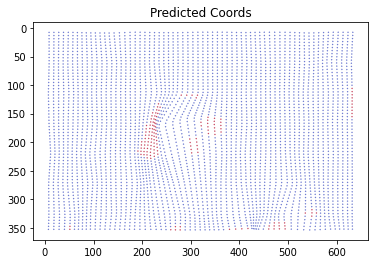

Training complete in 25m 45s
Train loss: 0.353665



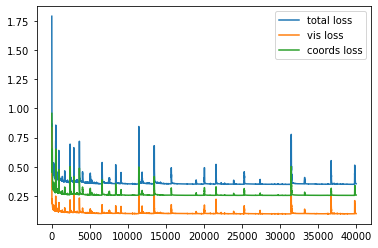

203
146


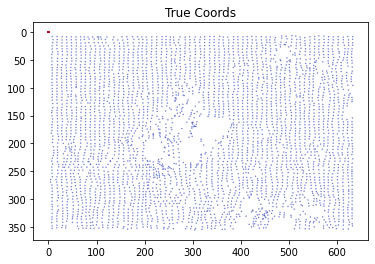

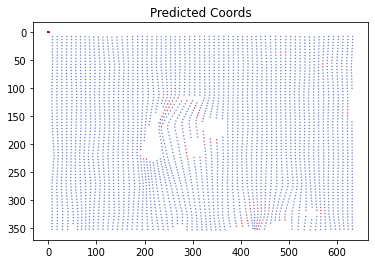

In [ ]:
# set computation device
device = torch.device('cuda')

# initialise model
modified_model = initialise_model(device, to_learn=['backbone.conv1.weight', 'classifier.4.weight', 'classifier.4.bias'])

# see what parameters will be tuned
params_to_update = modified_model.parameters()

print('Params to learn:')
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

# Define parameters
validation_split = .0
shuffle_dataset = True
random_seed = 42
batch_size = len(dataset)
num_epochs = 40_000

# Get train and validation dataloaders
train_loader, validation_loader = split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed)
dataloaders_dict = {'train': train_loader, 'val': validation_loader}

# Define optimizer
my_optimizer = optim.SGD(params_to_update, lr=0.05, momentum=0.9)

# Setup the loss
my_criterion = nn.MSELoss()
my_vis_criterion = nn.BCELoss()

# Train and evaluate
model6, model6_tloss,  model6_vloss,  model6_closs  = train_model(modified_model,
                                                                  dataloaders_dict,
                                                                  my_criterion,
                                                                  my_vis_criterion,
                                                                  my_optimizer,
                                                                  num_epochs=num_epochs,
                                                                  verbose=True)

## First, second and last layer

Params to learn:
backbone.conv1.weight
backbone.layer1.0.conv1.weight
classifier.4.weight
classifier.4.bias
----------
Epoch 0/39999
----------
train Loss: 1.9285
0.9767 coords loss, 0.9518 vis loss
203
1290


/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


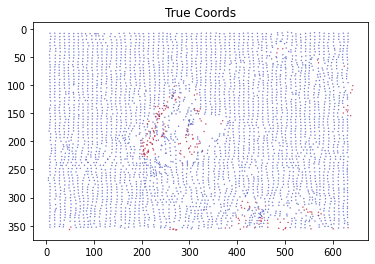

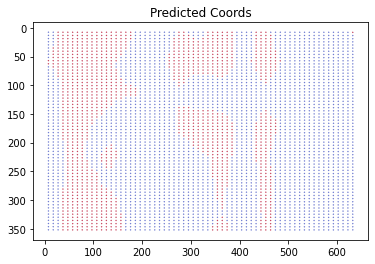

----------
Epoch 13333/39999
----------
train Loss: 0.3512
0.2543 coords loss, 0.0969 vis loss


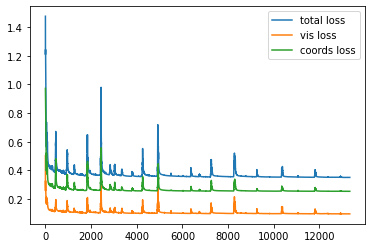

203
147


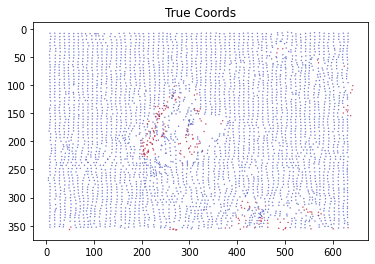

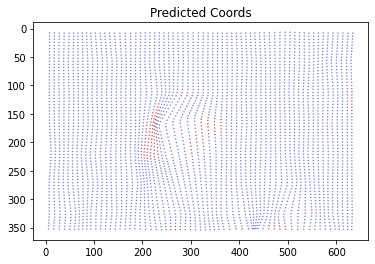

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 26666/39999
----------
train Loss: 0.3507
0.2543 coords loss, 0.0965 vis loss


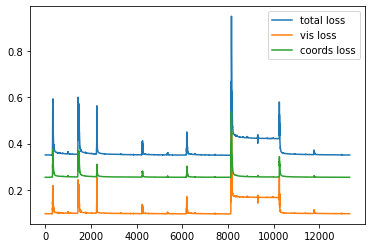

203
149


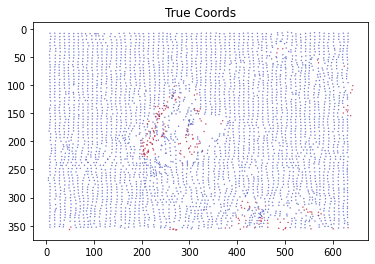

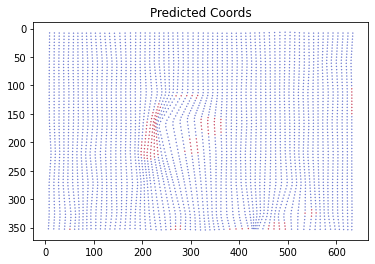

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 39999/39999
----------
train Loss: 0.3501
0.2540 coords loss, 0.0961 vis loss


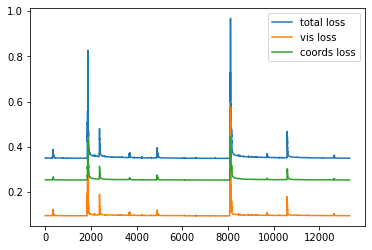

203
147


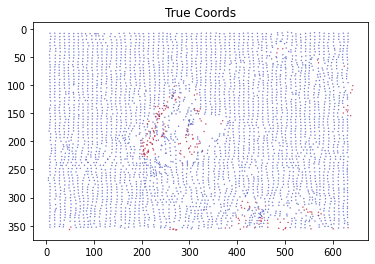

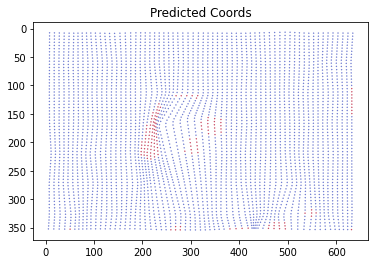

Training complete in 25m 16s
Train loss: 0.350086



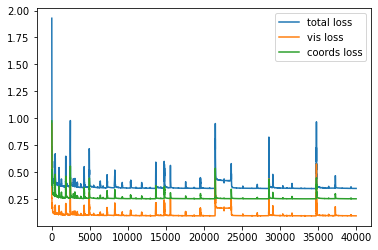

203
147


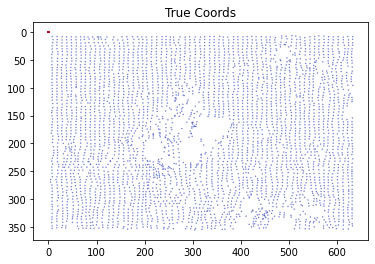

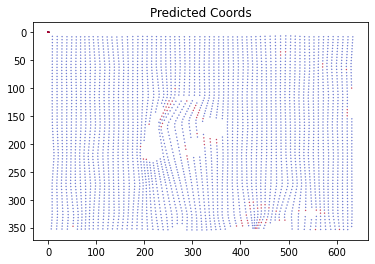

In [ ]:
# set computation device
device = torch.device('cuda')

# initialise model
modified_model = initialise_model(device, to_learn=['backbone.conv1.weight', 'backbone.layer1.0.conv1.weight', 'classifier.4.weight', 'classifier.4.bias'])

# see what parameters will be tuned
params_to_update = modified_model.parameters()

print('Params to learn:')
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

# Define parameters
validation_split = .0
shuffle_dataset = True
random_seed = 42
batch_size = len(dataset)
num_epochs = 40_000

# Get train and validation dataloaders
train_loader, validation_loader = split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed)
dataloaders_dict = {'train': train_loader, 'val': validation_loader}

# Define optimizer
my_optimizer = optim.SGD(params_to_update, lr=0.05, momentum=0.9)

# Setup the loss
my_criterion = nn.MSELoss()
my_vis_criterion = nn.BCELoss()

# Train and evaluate
model7, model7_tloss,  model7_vloss,  model7_closs  = train_model(modified_model,
                                                                  dataloaders_dict,
                                                                  my_criterion,
                                                                  my_vis_criterion,
                                                                  my_optimizer,
                                                                  num_epochs=num_epochs,
                                                                  verbose=True)

## All layers

Params to learn:
backbone.conv1.weight
backbone.bn1.weight
backbone.bn1.bias
backbone.layer1.0.conv1.weight
backbone.layer1.0.bn1.weight
backbone.layer1.0.bn1.bias
backbone.layer1.0.conv2.weight
backbone.layer1.0.bn2.weight
backbone.layer1.0.bn2.bias
backbone.layer1.0.conv3.weight
backbone.layer1.0.bn3.weight
backbone.layer1.0.bn3.bias
backbone.layer1.0.downsample.0.weight
backbone.layer1.0.downsample.1.weight
backbone.layer1.0.downsample.1.bias
backbone.layer1.1.conv1.weight
backbone.layer1.1.bn1.weight
backbone.layer1.1.bn1.bias
backbone.layer1.1.conv2.weight
backbone.layer1.1.bn2.weight
backbone.layer1.1.bn2.bias
backbone.layer1.1.conv3.weight
backbone.layer1.1.bn3.weight
backbone.layer1.1.bn3.bias
backbone.layer1.2.conv1.weight
backbone.layer1.2.bn1.weight
backbone.layer1.2.bn1.bias
backbone.layer1.2.conv2.weight
backbone.layer1.2.bn2.weight
backbone.layer1.2.bn2.bias
backbone.layer1.2.conv3.weight
backbone.layer1.2.bn3.weight
backbone.layer1.2.bn3.bias
backbone.layer2.0.conv1.weig

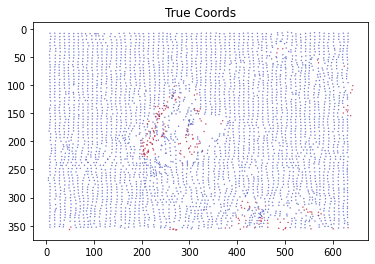

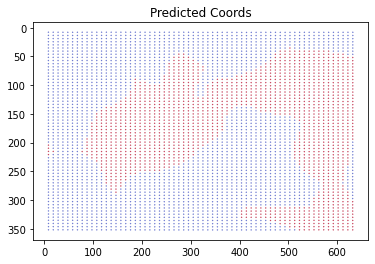

----------
Epoch 13333/39999
----------
train Loss: 0.3426
0.2529 coords loss, 0.0898 vis loss


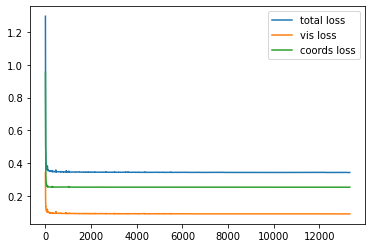

203
152


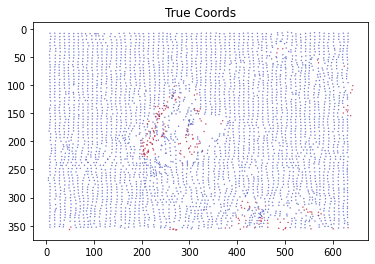

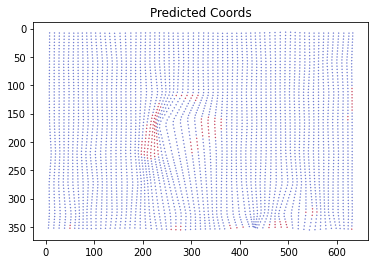

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 26666/39999
----------
train Loss: 0.3423
0.2528 coords loss, 0.0895 vis loss


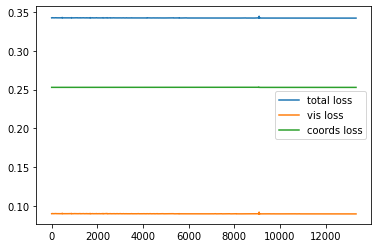

203
152


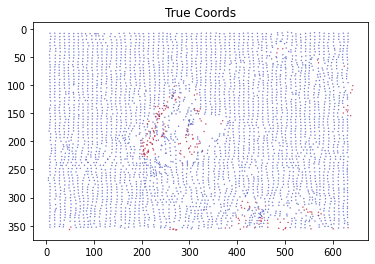

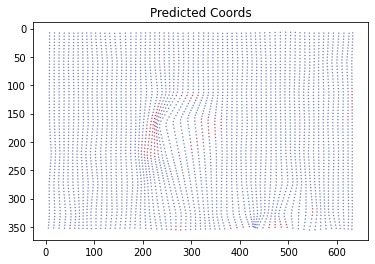

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 39999/39999
----------
train Loss: 0.3421
0.2528 coords loss, 0.0893 vis loss


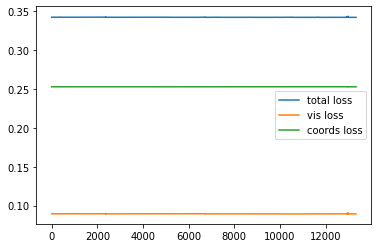

203
152


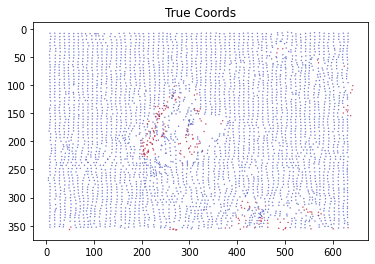

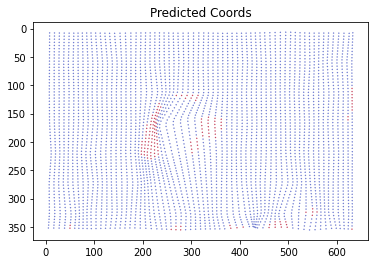

Training complete in 40m 2s
Train loss: 0.342126



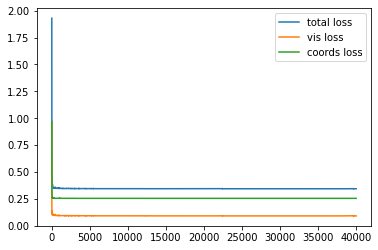

203
152


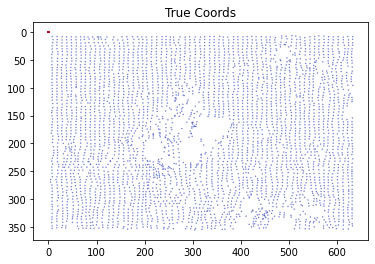

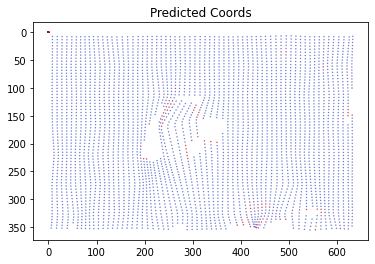

In [ ]:
# set computation device
device = torch.device('cuda')

# initialise model
modified_model = initialise_model(device, to_learn=['all'])

# see what parameters will be tuned
params_to_update = modified_model.parameters()
print('Params to learn:')
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

# Define parameters
validation_split = .0
shuffle_dataset = True
random_seed = 42
batch_size = len(dataset)
num_epochs = 40_000

# Get train and validation dataloaders
train_loader, validation_loader = split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed)
dataloaders_dict = {'train': train_loader, 'val': validation_loader}

# Define optimizer
my_optimizer = optim.SGD(params_to_update, lr=0.05, momentum=0.9)

# Setup the loss
my_criterion = nn.MSELoss()
my_vis_criterion = nn.BCELoss()

# Train and evaluate
model8, model8_tloss,  model8_vloss,  model8_closs  = train_model(modified_model,
                                                                  dataloaders_dict,
                                                                  my_criterion,
                                                                  my_vis_criterion,
                                                                  my_optimizer,
                                                                  num_epochs=num_epochs,
                                                                  verbose=True)


## Results

In [ ]:
# epochs : 40K
# SGD, lr = 0.05

from tabulate import tabulate

last = ['last layer', model5_tloss[0], model5_tloss[1000-1], model5_tloss[5000-1], model5_tloss[10000-1], model5_tloss[20000-1], model5_tloss[40000-1]]
first = ['+ first layer', model6_tloss[0], model6_tloss[1000-1], model6_tloss[5000-1], model6_tloss[10000-1], model6_tloss[20000-1], model6_tloss[40000-1]]
second = ['+ second layer', model7_tloss[0], model7_tloss[1000-1], model7_tloss[5000-1], model7_tloss[10000-1], model7_tloss[20000-1], model7_tloss[40000-1]]
all = ['all layers', model8_tloss[0], model8_tloss[1000-1], model8_tloss[5000-1], model8_tloss[10000-1], model8_tloss[20000-1], model8_tloss[40000-1]]


results = [['fine-tuning lr=0.05', 'E=0', 'E=1000', 'E=5000','E=10_000', 'E=20_000', 'E=40_000'],
           last,
           first, 
           second,
           all]

print(tabulate(results, headers='firstrow', tablefmt='fancy_grid'))

╒═══════════════════════╤═════════╤══════════╤══════════╤════════════╤════════════╤════════════╕
│ fine-tuning lr=0.05   │     E=0 │   E=1000 │   E=5000 │   E=10_000 │   E=20_000 │   E=40_000 │
╞═══════════════════════╪═════════╪══════════╪══════════╪════════════╪════════════╪════════════╡
│ last layer            │ 1.82521 │ 0.561597 │ 0.413667 │   0.384456 │   0.368654 │   0.360481 │
├───────────────────────┼─────────┼──────────┼──────────┼────────────┼────────────┼────────────┤
│ + first layer         │ 1.79175 │ 0.409971 │ 0.357213 │   0.352694 │   0.350085 │   0.353665 │
├───────────────────────┼─────────┼──────────┼──────────┼────────────┼────────────┼────────────┤
│ + second layer        │ 1.9285  │ 0.403252 │ 0.385173 │   0.353669 │   0.352082 │   0.350086 │
├───────────────────────┼─────────┼──────────┼──────────┼────────────┼────────────┼────────────┤
│ all layers            │ 1.93085 │ 0.345564 │ 0.3434   │   0.342845 │   0.342419 │   0.342126 │
╘═══════════════════════╧═════

# Ensuring model is in train mode all the time

In [6]:
def x_train_model(model, dataloaders, criterion, vis_criterion, optimizer, num_epochs=25, verbose=False, mask=True):
  model.to(device)
  since = time.time()

  val_loss_history = []
  train_loss_history = []
  vis_loss_history = []
  coords_loss_history = []

  best_model_wts = copy.deepcopy(model.state_dict())

  for epoch in range(0,num_epochs):

        # Each epoch has a training and validation phase
        for phase in ['train']:
            if phase == 'train':
                model.train() # Set model to training mode
            else:
                model.eval() # Set model to evaluate mode

            running_loss = 0.0
            running_vis_loss = 0.0
            running_coords_loss = 0.0
            total_samples=0

            # Iterate over data.
            for i_batch, sample_batched in enumerate(dataloaders[phase]):
              batch_size = len(sample_batched['id'])
              total_samples+=batch_size

              input1 = sample_batched['image0']
              input2 = sample_batched['image3']
              inputs = torch.cat((input1, input2), dim=1) # concatenate tensors on C dim
              # print(inputs.size())
              coords = sample_batched['coords']
              vis = torch.where(sample_batched['vis'] > 0, 1.0, 0.0)
              # vis = sample_batched['vis']

              inputs = inputs.to(device).float() #torch.Size([B, 3, 120, 240])
              coords = coords.to(device) # torch.Size([B, 1, 4096, 2])
              vis = vis.to(device)

              # zero the parameter gradients
              optimizer.zero_grad()

              # forward and track history if only in train
              with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    outputs = model(inputs) # torch.Size([B, 3, H, W]) same as inputs shape
                    outputs = outputs['out']

                    # TO DO: ABSTRACT THIS
                    # take the values of outputs from the NxN grid points
                    grid = get_grid(coords.shape[2], batch_size, outputs.shape[2], outputs.shape[3], normalise=True) # ([B, H(64), W(64), 2])
                    outputs = torch.nn.functional.grid_sample(outputs, grid) # torch.size([B,2,H,W])

                    # reshape to match target shape
                    outputs = torch.permute(outputs, (0, 2, 3, 1)) # torch.Size([B, H, W, 2])

                    # get vis predictions
                    outputs_coords = outputs[:, :, :, :2]
                    outputs_vis = outputs[:, : , :, -1] # changing to tensor with 0s and 1s??
                    outputs_vis = outputs_vis.view(batch_size,1,-1) # torch.Size([B, 1, 64*64])

                    ## coordinates = predicted displacement + grid points in (B, 360, 640, 2)
                    original_points = get_grid(coords.shape[2], batch_size, 360, 640)
                    outputs_coords = original_points + outputs_coords
                    outputs_coords = outputs_coords.view(batch_size,1,-1,2) # torch.Size([B, 1, 64*64, 2])

                    # take points that are not visible from vis ground truth data
                    point_visiblity = vis > 0 # Boolean array with True if visible

                    # zero out those in both outputs_coords and coords
                    # so they dont contribute to coords_loss
                    outputs_coords_zeroed = torch.zeros_like(outputs_coords)
                    coords_zeroed = torch.zeros_like(coords)
                    outputs_coords_zeroed[:, :, :, 0] = torch.where(point_visiblity, outputs_coords[:, :, :, 0], 0)
                    outputs_coords_zeroed[:, :, :, 1] = torch.where(point_visiblity, outputs_coords[:, :, :, 1], 0)
                    coords_zeroed[:, :, :, 0] = torch.where(point_visiblity, coords[:, :, :, 0], 0)
                    coords_zeroed[:, :, :, 1] = torch.where(point_visiblity, coords[:, :, :, 1], 0)

                    sigmoid = nn.Sigmoid()
                    vis_loss = (vis_criterion(sigmoid(outputs_vis), vis))/ 0.7
                    if mask:
                      coords_loss = (criterion(outputs_coords_zeroed, coords_zeroed))/20
                    else:
                      coords_loss = (criterion(outputs_coords, coords))/20
                    loss = coords_loss + vis_loss
                    

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_vis_loss += vis_loss.item() * inputs.size(0)
                    running_coords_loss += coords_loss.item() * inputs.size(0)

            if phase == "train" and verbose:
              epoch_loss = running_loss / total_samples
              train_loss_history.append(epoch_loss)
              vis_loss_history.append(running_vis_loss/total_samples)
              coords_loss_history.append(running_coords_loss/total_samples)

              report_frequency = num_epochs//3
              if epoch%report_frequency==0:
                print('-' * 10)
                print('Epoch {}/{}'.format(epoch, num_epochs - 1))
                print('-' * 10)

                print('{} Loss: {:.4f}'.format(phase, epoch_loss))
                print('{:.4f} coords loss, {:.4f} vis loss'.format(coords_loss, vis_loss))
                if epoch != 0:
                  plot_learning_curve(train_loss_history[-report_frequency:], vis_loss_history[-report_frequency:], coords_loss_history[-report_frequency:])

                if batch_size==1:
                  show_predictions(outputs_coords.squeeze(), outputs_vis.squeeze(), coords.squeeze(), vis.squeeze())


            # deep copy the model
            if epoch == 0:
                best_loss = epoch_loss
            if phase == 'val' and epoch_loss < best_loss:
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_loss_history.append(epoch_loss)

            
  time_elapsed = time.time() - since
  print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
  print('Train loss: {:4f}\n'.format(epoch_loss))

  # load best model weights
  model.load_state_dict(best_model_wts)
  plot_learning_curve(train_loss_history, vis_loss_history, coords_loss_history)
  show_predictions(outputs_coords.squeeze(), outputs_vis.squeeze(), coords.squeeze(), vis.squeeze(), zeroed=True)
  return model, train_loss_history, vis_loss_history, coords_loss_history


Params to learn:
backbone.conv1.weight
backbone.layer1.0.conv1.weight
classifier.4.weight
classifier.4.bias
----------
Epoch 0/39999
----------
train Loss: 1.8596
0.9721 coords loss, 0.8875 vis loss
203
414


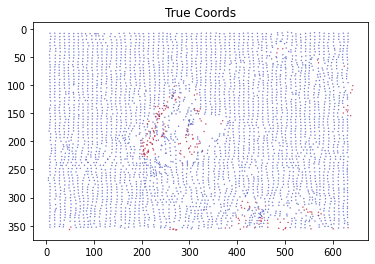

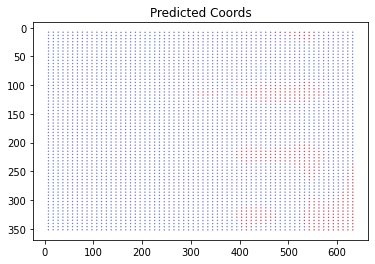

----------
Epoch 13333/39999
----------
train Loss: 0.3530
0.2548 coords loss, 0.0982 vis loss


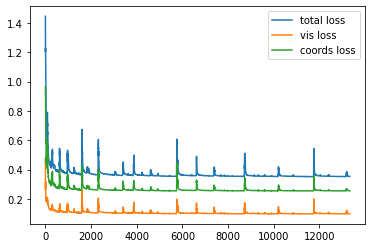

203
139


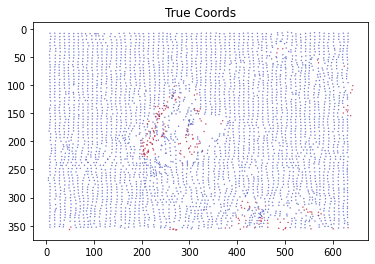

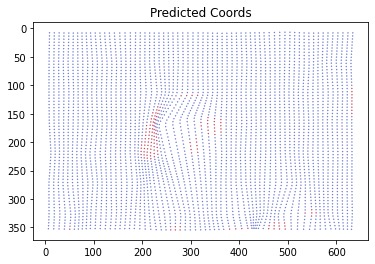

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 26666/39999
----------
train Loss: 0.3504
0.2541 coords loss, 0.0963 vis loss


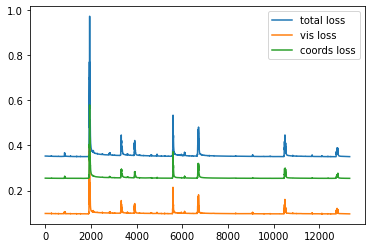

203
150


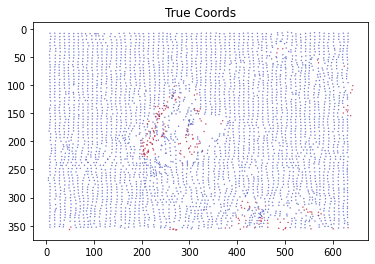

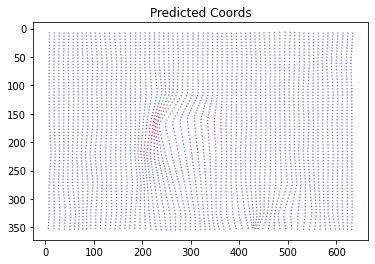

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 39999/39999
----------
train Loss: 0.3508
0.2544 coords loss, 0.0965 vis loss


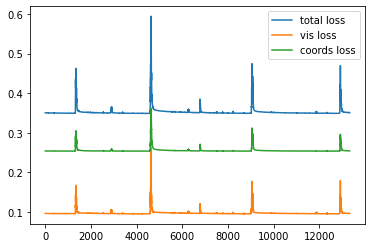

203
146


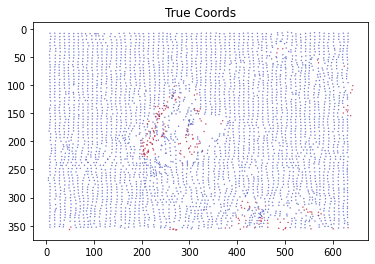

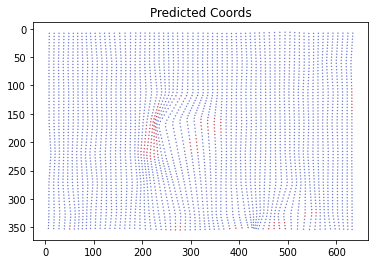

Training complete in 23m 8s
Train loss: 0.350834



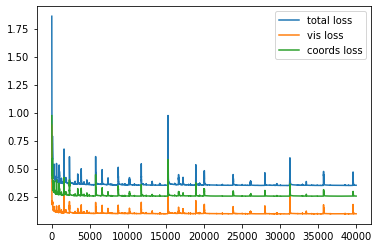

203
146


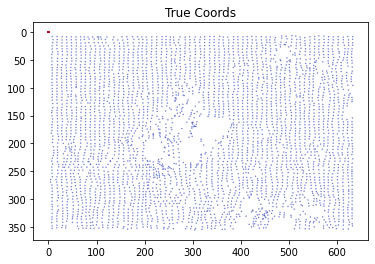

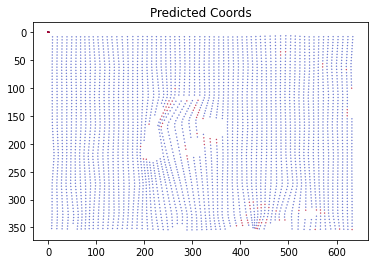

In [8]:
# set computation device
device = torch.device('cuda')

# initialise model
modified_model = initialise_model(device, to_learn=['backbone.conv1.weight', 'backbone.layer1.0.conv1.weight', 'classifier.4.weight', 'classifier.4.bias'])

# see what parameters will be tuned
params_to_update = modified_model.parameters()

print('Params to learn:')
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

# Define parameters
validation_split = .0
shuffle_dataset = True
random_seed = 42
batch_size = len(dataset)
num_epochs = 40_000

# Get train and validation dataloaders
train_loader, validation_loader = split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed)
dataloaders_dict = {'train': train_loader, 'val': validation_loader}

# Define optimizer
my_optimizer = optim.SGD(params_to_update, lr=0.05, momentum=0.9)

# Setup the loss
my_criterion = nn.MSELoss()
my_vis_criterion = nn.BCELoss()

# Train and evaluate
model7, model7_tloss,  model7_vloss,  model7_closs  = x_train_model(modified_model,
                                                                  dataloaders_dict,
                                                                  my_criterion,
                                                                  my_vis_criterion,
                                                                  my_optimizer,
                                                                  num_epochs=num_epochs,
                                                                  verbose=True)

# Trying gradient value clipping

In [9]:
def c_train_model(model, dataloaders, criterion, vis_criterion, optimizer, num_epochs=25, verbose=False, mask=True):
  model.to(device)
  since = time.time()

  val_loss_history = []
  train_loss_history = []
  vis_loss_history = []
  coords_loss_history = []

  best_model_wts = copy.deepcopy(model.state_dict())

  for epoch in range(0,num_epochs):

        # Each epoch has a training and validation phase
        for phase in ['train']:
            if phase == 'train':
                model.train() # Set model to training mode
            else:
                model.eval() # Set model to evaluate mode

            running_loss = 0.0
            running_vis_loss = 0.0
            running_coords_loss = 0.0
            total_samples=0

            # Iterate over data.
            for i_batch, sample_batched in enumerate(dataloaders[phase]):
              batch_size = len(sample_batched['id'])
              total_samples+=batch_size

              input1 = sample_batched['image0']
              input2 = sample_batched['image3']
              inputs = torch.cat((input1, input2), dim=1) # concatenate tensors on C dim
              # print(inputs.size())
              coords = sample_batched['coords']
              vis = torch.where(sample_batched['vis'] > 0, 1.0, 0.0)
              # vis = sample_batched['vis']

              inputs = inputs.to(device).float() #torch.Size([B, 3, 120, 240])
              coords = coords.to(device) # torch.Size([B, 1, 4096, 2])
              vis = vis.to(device)

              # zero the parameter gradients
              optimizer.zero_grad()

              # forward and track history if only in train
              with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    outputs = model(inputs) # torch.Size([B, 3, H, W]) same as inputs shape
                    outputs = outputs['out']

                    # TO DO: ABSTRACT THIS
                    # take the values of outputs from the NxN grid points
                    grid = get_grid(coords.shape[2], batch_size, outputs.shape[2], outputs.shape[3], normalise=True) # ([B, H(64), W(64), 2])
                    outputs = torch.nn.functional.grid_sample(outputs, grid) # torch.size([B,2,H,W])

                    # reshape to match target shape
                    outputs = torch.permute(outputs, (0, 2, 3, 1)) # torch.Size([B, H, W, 2])

                    # get vis predictions
                    outputs_coords = outputs[:, :, :, :2]
                    outputs_vis = outputs[:, : , :, -1] # changing to tensor with 0s and 1s??
                    outputs_vis = outputs_vis.view(batch_size,1,-1) # torch.Size([B, 1, 64*64])

                    ## coordinates = predicted displacement + grid points in (B, 360, 640, 2)
                    original_points = get_grid(coords.shape[2], batch_size, 360, 640)
                    outputs_coords = original_points + outputs_coords
                    outputs_coords = outputs_coords.view(batch_size,1,-1,2) # torch.Size([B, 1, 64*64, 2])

                    # take points that are not visible from vis ground truth data
                    point_visiblity = vis > 0 # Boolean array with True if visible

                    # zero out those in both outputs_coords and coords
                    # so they dont contribute to coords_loss
                    outputs_coords_zeroed = torch.zeros_like(outputs_coords)
                    coords_zeroed = torch.zeros_like(coords)
                    outputs_coords_zeroed[:, :, :, 0] = torch.where(point_visiblity, outputs_coords[:, :, :, 0], 0)
                    outputs_coords_zeroed[:, :, :, 1] = torch.where(point_visiblity, outputs_coords[:, :, :, 1], 0)
                    coords_zeroed[:, :, :, 0] = torch.where(point_visiblity, coords[:, :, :, 0], 0)
                    coords_zeroed[:, :, :, 1] = torch.where(point_visiblity, coords[:, :, :, 1], 0)

                    sigmoid = nn.Sigmoid()
                    vis_loss = (vis_criterion(sigmoid(outputs_vis), vis))/ 0.7
                    if mask:
                      coords_loss = (criterion(outputs_coords_zeroed, coords_zeroed))/20
                    else:
                      coords_loss = (criterion(outputs_coords, coords))/20
                    loss = coords_loss + vis_loss
                    

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()

                        # Gradient Norm Clipping
                        #nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0, norm_type=2)

                        #Gradient Value Clipping
                        nn.utils.clip_grad_value_(model.parameters(), clip_value=1.0)

                        optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_vis_loss += vis_loss.item() * inputs.size(0)
                    running_coords_loss += coords_loss.item() * inputs.size(0)

            if phase == "train" and verbose:
              epoch_loss = running_loss / total_samples
              train_loss_history.append(epoch_loss)
              vis_loss_history.append(running_vis_loss/total_samples)
              coords_loss_history.append(running_coords_loss/total_samples)

              report_frequency = num_epochs//3
              if epoch%report_frequency==0:
                print('-' * 10)
                print('Epoch {}/{}'.format(epoch, num_epochs - 1))
                print('-' * 10)

                print('{} Loss: {:.4f}'.format(phase, epoch_loss))
                print('{:.4f} coords loss, {:.4f} vis loss'.format(coords_loss, vis_loss))
                if epoch != 0:
                  plot_learning_curve(train_loss_history[-report_frequency:], vis_loss_history[-report_frequency:], coords_loss_history[-report_frequency:])

                if batch_size==1:
                  show_predictions(outputs_coords.squeeze(), outputs_vis.squeeze(), coords.squeeze(), vis.squeeze())


            # deep copy the model
            if epoch == 0:
                best_loss = epoch_loss
            if phase == 'val' and epoch_loss < best_loss:
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_loss_history.append(epoch_loss)

            
  time_elapsed = time.time() - since
  print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
  print('Train loss: {:4f}\n'.format(epoch_loss))

  # load best model weights
  model.load_state_dict(best_model_wts)
  plot_learning_curve(train_loss_history, vis_loss_history, coords_loss_history)
  show_predictions(outputs_coords.squeeze(), outputs_vis.squeeze(), coords.squeeze(), vis.squeeze(), zeroed=True)
  return model, train_loss_history, vis_loss_history, coords_loss_history

Params to learn:
backbone.conv1.weight
backbone.layer1.0.conv1.weight
classifier.4.weight
classifier.4.bias
----------
Epoch 0/39999
----------
train Loss: 1.9085
0.9828 coords loss, 0.9257 vis loss
203
1147


/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


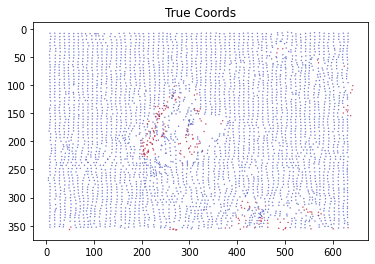

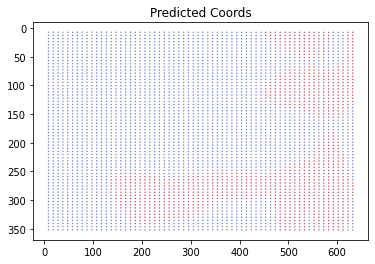

----------
Epoch 13333/39999
----------
train Loss: 0.3593
0.2574 coords loss, 0.1019 vis loss


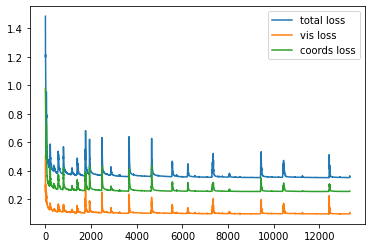

203
134


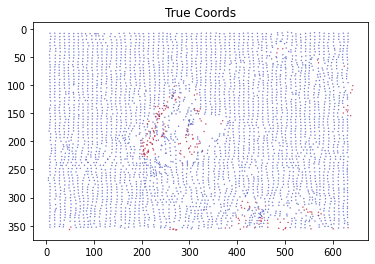

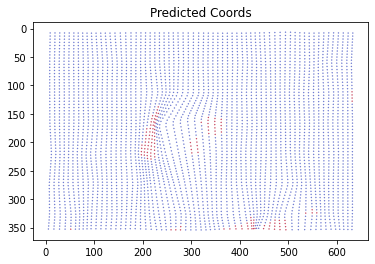

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 26666/39999
----------
train Loss: 0.3495
0.2538 coords loss, 0.0957 vis loss


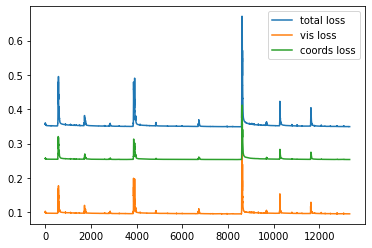

203
148


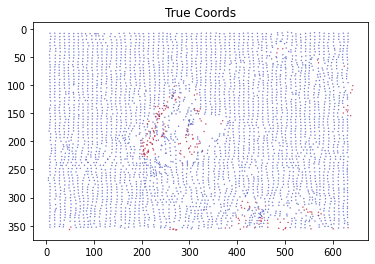

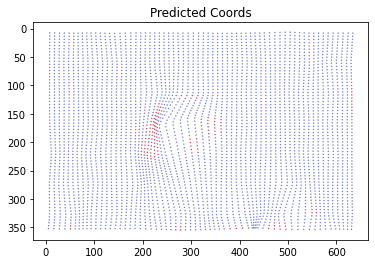

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 39999/39999
----------
train Loss: 0.3495
0.2541 coords loss, 0.0954 vis loss


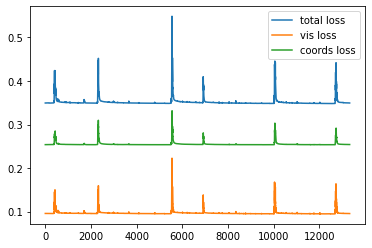

203
148


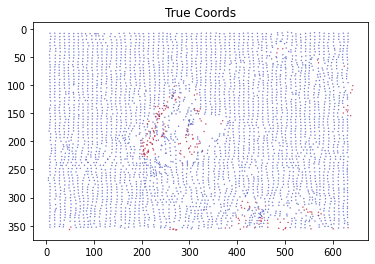

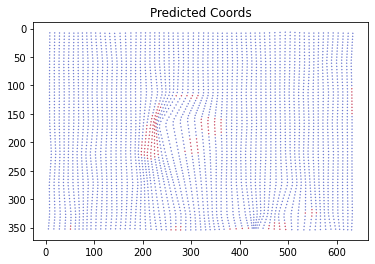

Training complete in 22m 54s
Train loss: 0.349483



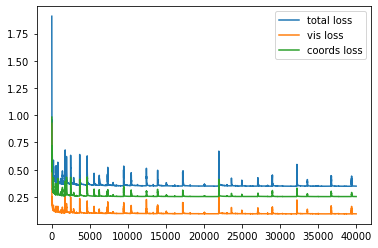

203
148


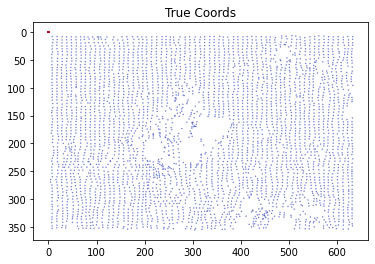

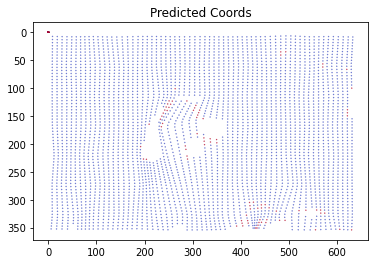

In [10]:
# set computation device
device = torch.device('cuda')

# initialise model
modified_model = initialise_model(device, to_learn=['backbone.conv1.weight', 'backbone.layer1.0.conv1.weight', 'classifier.4.weight', 'classifier.4.bias'])

# see what parameters will be tuned
params_to_update = modified_model.parameters()

print('Params to learn:')
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

# Define parameters
validation_split = .0
shuffle_dataset = True
random_seed = 42
batch_size = len(dataset)
num_epochs = 40_000

# Get train and validation dataloaders
train_loader, validation_loader = split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed)
dataloaders_dict = {'train': train_loader, 'val': validation_loader}

# Define optimizer
my_optimizer = optim.SGD(params_to_update, lr=0.05, momentum=0.9)

# Setup the loss
my_criterion = nn.MSELoss()
my_vis_criterion = nn.BCELoss()

# Train and evaluate
model7, model7_tloss,  model7_vloss,  model7_closs  = c_train_model(modified_model,
                                                                  dataloaders_dict,
                                                                  my_criterion,
                                                                  my_vis_criterion,
                                                                  my_optimizer,
                                                                  num_epochs=num_epochs,
                                                                  verbose=True)

In [8]:
def initialise_model(device, to_learn=[]):
  # Initialize model with the best available weights
  # create an instance of torchvision.models.segmentation.fcn_resnet50
  # and load pretrained weights
  weights = FCN_ResNet50_Weights.DEFAULT
  modified_model = fcn_resnet50(weights=weights)

  # Get weights in the first layer and double
  model_weights = {k: (v, v.dtype, v.shape) for k, v in modified_model.state_dict().items()}
  first_layer_weights = model_weights['backbone.conv1.weight'][0]
  doubled_weights = first_layer_weights.repeat(1, 2, 1, 1)


  # Modify the model by doubling input channel from 3 to 6 channels
  modified_model.backbone.conv1 = nn.Conv2d(6, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  # Copy the doubled weights into first layer
  with torch.no_grad():
      modified_model.backbone.conv1.weight = torch.nn.Parameter(doubled_weights)

  # Remove final layer and replace with a 3 channel output: xy displacement and visibility (instead of 20 class logits)
  # instead of torch.Size([1, 21, H, W]) -> torch.Size([1, 3, H, W])
  modified_model.classifier[3] = nn.Sequential()
  modified_model.classifier[4] = nn.Conv2d(512, 3, kernel_size=(1, 1), stride=(1, 1))

  # Choose which params to tune
  if "all" not in to_learn:
    for name, param in modified_model.named_parameters():
      if name not in to_learn:
        param.requires_grad = False

  # Model to train() and load onto computation devicce
  modified_model.to(device)
  modified_model.train()

  return modified_model

In [6]:
def train_model(model, dataloaders, criterion, vis_criterion, optimizer, num_epochs=25, verbose=False, mask=True):
  model.to(device)
  since = time.time()

  # Log loss history
  train_loss_history = []
  vis_loss_history = []
  coords_loss_history = []

  for epoch in range(0,num_epochs):

        # Each epoch has a training and validation phase, now only set to 'train'
        for phase in ['train']:
            if phase == 'train':
                model.train() # Set model to training mode
            else:
                model.eval() # Set model to evaluate mode

            running_loss = 0.0
            running_vis_loss = 0.0
            running_coords_loss = 0.0
            total_samples=0

            # Iterate over data.
            for i_batch, sample_batched in enumerate(dataloaders[phase]):
              batch_size = len(sample_batched['id'])
              total_samples+=batch_size
              
              # Get input images and concatenate image tensors on channel dimension
              input1 = sample_batched['image0']
              input2 = sample_batched['image3']
              inputs = torch.cat((input1, input2), dim=1) 

              # Get ground truth coords and vis
              coords = sample_batched['coords']
              vis = torch.where(sample_batched['vis'] > 0, 1.0, 0.0)
              
              inputs = inputs.to(device).float() #torch.Size([B, 3, 120, 240])
              coords = coords.to(device) # torch.Size([B, 1, 4096, 2])
              vis = vis.to(device)

              # Zero the parameter gradients
              optimizer.zero_grad()

              # Forward and track history if only in train
              with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    outputs = model(inputs) # torch.Size([B, 3, H, W]) same as inputs shape
                    outputs = outputs['out']

                    # Take the values of outputs from the NxN grid points
                    grid = get_grid(coords.shape[2], batch_size, outputs.shape[2], outputs.shape[3], normalise=True) # ([B, H(64), W(64), 2])
                    outputs = torch.nn.functional.grid_sample(outputs, grid) # torch.size([B,2,H,W])

                    # Reshape to match target shape
                    outputs = torch.permute(outputs, (0, 2, 3, 1)) # torch.Size([B, H, W, 2])

                    # Get vis predictions
                    outputs_coords = outputs[:, :, :, :2]
                    outputs_vis = outputs[:, : , :, -1] # changing to tensor with 0s and 1s??
                    outputs_vis = outputs_vis.view(batch_size,1,-1) # torch.Size([B, 1, 64*64])

                    # Coordinates = predicted displacement + grid points in (B, 360, 640, 2)
                    original_points = get_grid(coords.shape[2], batch_size, 360, 640)
                    outputs_coords = original_points + outputs_coords
                    outputs_coords = outputs_coords.view(batch_size,1,-1,2) # torch.Size([B, 1, 64*64, 2])

                    # Take points that are not visible from vis ground truth data
                    point_visiblity = vis > 0 # Boolean array with True if visible

                    # Zero out those in both outputs_coords and coords so they dont contribute to coords_loss
                    outputs_coords_zeroed = torch.zeros_like(outputs_coords)
                    coords_zeroed = torch.zeros_like(coords)
                    outputs_coords_zeroed[:, :, :, 0] = torch.where(point_visiblity, outputs_coords[:, :, :, 0], 0)
                    outputs_coords_zeroed[:, :, :, 1] = torch.where(point_visiblity, outputs_coords[:, :, :, 1], 0)
                    coords_zeroed[:, :, :, 0] = torch.where(point_visiblity, coords[:, :, :, 0], 0)
                    coords_zeroed[:, :, :, 1] = torch.where(point_visiblity, coords[:, :, :, 1], 0)

                    sigmoid = nn.Sigmoid()
                    vis_loss = (vis_criterion(sigmoid(outputs_vis), vis))/ 0.7
                    if mask:
                      coords_loss = (criterion(outputs_coords_zeroed, coords_zeroed))/20
                    else:
                      coords_loss = (criterion(outputs_coords, coords))/20
                    loss = coords_loss + vis_loss
                    

                    # Backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()

                        # Gradient Norm Clipping
                        #nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0, norm_type=2)

                        #Gradient Value Clipping
                        nn.utils.clip_grad_value_(model.parameters(), clip_value=1.0)

                        optimizer.step()

                    # Statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_vis_loss += vis_loss.item() * inputs.size(0)
                    running_coords_loss += coords_loss.item() * inputs.size(0)

            # Report
            if phase == "train" and verbose:
              epoch_loss = running_loss / total_samples
              train_loss_history.append(epoch_loss)
              vis_loss_history.append(running_vis_loss/total_samples)
              coords_loss_history.append(running_coords_loss/total_samples)

              report_frequency = num_epochs//3
              if epoch%report_frequency==0:
                print('-' * 10)
                print('Epoch {}/{}'.format(epoch, num_epochs - 1))
                print('-' * 10)

                print('{} Loss: {:.4f}'.format(phase, epoch_loss))
                print('{:.4f} coords loss, {:.4f} vis loss'.format(coords_loss, vis_loss))
                if epoch != 0:
                  plot_learning_curve(train_loss_history[-report_frequency:], vis_loss_history[-report_frequency:], coords_loss_history[-report_frequency:])

                if batch_size==1:
                  show_predictions(outputs_coords.squeeze(), outputs_vis.squeeze(), coords.squeeze(), vis.squeeze())


  time_elapsed = time.time() - since
  print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
  print('Train loss: {:4f}\n'.format(epoch_loss))

  # load best model weights
  best_model_wts = copy.deepcopy(model.state_dict())
  model.load_state_dict(best_model_wts)

  # show final predictions
  show_predictions(outputs_coords.squeeze(), outputs_vis.squeeze(), coords.squeeze(), vis.squeeze(), zeroed=True)
  plot_learning_curve(train_loss_history, vis_loss_history, coords_loss_history)

  return model, train_loss_history, vis_loss_history, coords_loss_history

Params to learn:
backbone.conv1.weight
backbone.layer1.0.conv1.weight
classifier.4.weight
classifier.4.bias
----------
Epoch 0/39999
----------
train Loss: 1.9018
0.9680 coords loss, 0.9337 vis loss
203
879


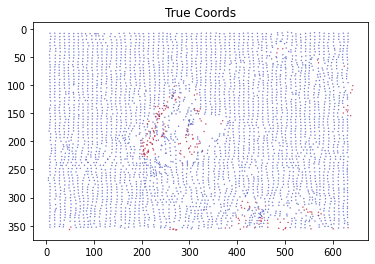

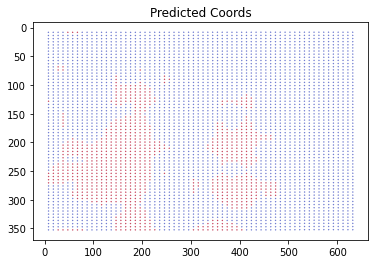

----------
Epoch 13333/39999
----------
train Loss: 0.2145
0.1408 coords loss, 0.0737 vis loss


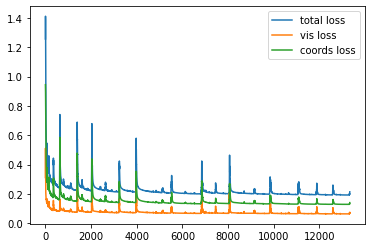

203
170


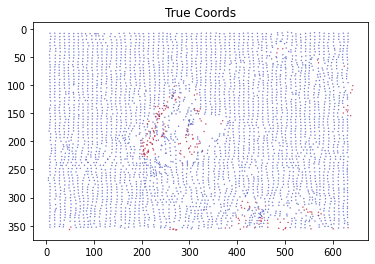

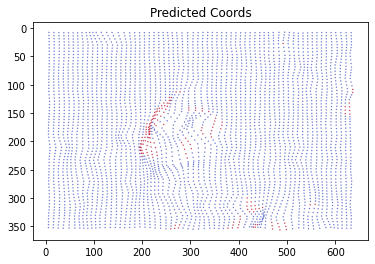

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 26666/39999
----------
train Loss: 0.1917
0.1288 coords loss, 0.0629 vis loss


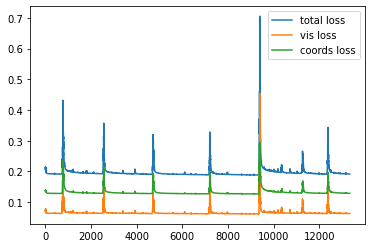

203
171


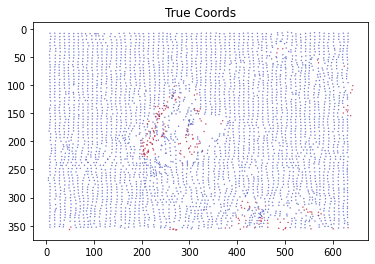

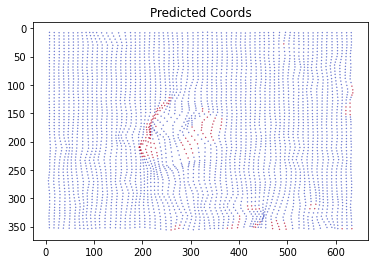

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


----------
Epoch 39999/39999
----------
train Loss: 0.1893
0.1275 coords loss, 0.0618 vis loss


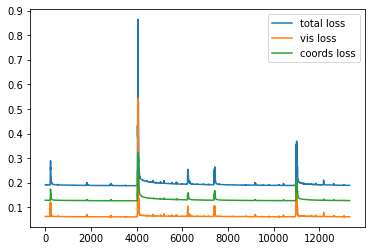

203
168


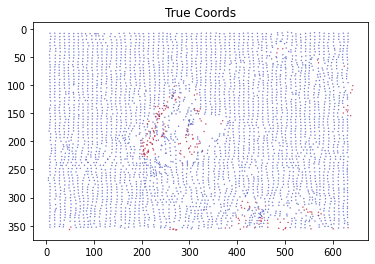

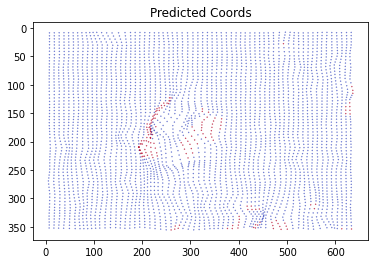

Training complete in 55m 34s
Train loss: 0.189341

203
168


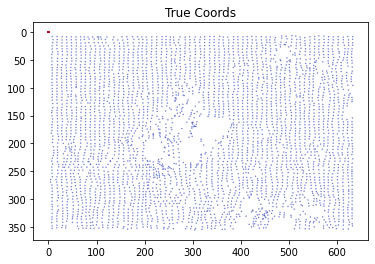

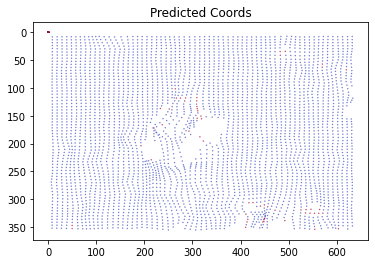

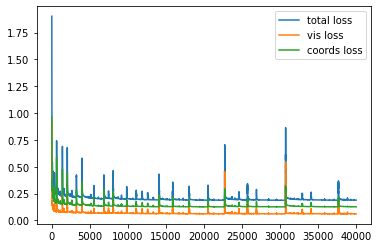

In [10]:
# set computation device
device = torch.device('cuda')

# initialise model
modified_model = initialise_model(device, to_learn=['backbone.conv1.weight', 'backbone.layer1.0.conv1.weight', 'classifier.4.weight', 'classifier.4.bias'])

# see what parameters will be tuned
params_to_update = modified_model.parameters()

print('Params to learn:')
for name, param in modified_model.named_parameters():
  if param.requires_grad:
      print(name)

# Define parameters
validation_split = .0
shuffle_dataset = True
random_seed = 42
batch_size = len(dataset)
num_epochs = 40_000

# Get train and validation dataloaders
train_loader, validation_loader = split_dataset(dataset, validation_split, batch_size, shuffle_dataset, random_seed)
dataloaders_dict = {'train': train_loader, 'val': validation_loader}

# Define optimizer
my_optimizer = optim.SGD(params_to_update, lr=0.101, momentum=0.9)

# Setup the loss
my_criterion = nn.MSELoss()
my_vis_criterion = nn.BCELoss()

# Train and evaluate
model3, model3_tloss,  model3_vloss,  model3_closs  = train_model(modified_model,
                                                                  dataloaders_dict,
                                                                  my_criterion,
                                                                  my_vis_criterion,
                                                                  my_optimizer,
                                                                  num_epochs=num_epochs,
                                                                  verbose=True)